In [1]:
# AgroSense 2.0 — All imports
import os, random, subprocess
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import torch.nn as nn
from torchvision import transforms, datasets, models
from torch.utils.data import DataLoader, Dataset, random_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import lightgbm as lgb
from PIL import Image
import cv2
import shap

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"✅ All imports done | Device: {device}")

✅ All imports done | Device: cuda


In [2]:
import os

# Correct base path
base = "/kaggle/input/datasets"

print("=== DATASET STRUCTURE ===")
for item in os.listdir(base):
    item_path = os.path.join(base, item)
    if os.path.isdir(item_path):
        files = os.listdir(item_path)
        print(f"📁 {item}/ → {len(files)} items")
    else:
        size = os.path.getsize(item_path)
        print(f"📄 {item} → {size/1e6:.1f} MB")

=== DATASET STRUCTURE ===
📁 tmleyncodes/ → 1 items


In [3]:
import rasterio
import numpy as np

tif_path = "/kaggle/input/datasets/tmleyncodes/agriculture-dataset/agriculture_dataset/india_soil_7bands.tif"

src = rasterio.open(tif_path)

print("=== RASTER INFO ===")
print("Bands:", src.count)
print("Width:", src.width)
print("Height:", src.height)
print("CRS:", src.crs)

print("\n=== BAND STATISTICS ===")

for i in range(1, src.count + 1):
    band = src.read(i)

    print(f"\nBand {i}")
    print("Min:", np.nanmin(band))
    print("Max:", np.nanmax(band))
    print("Mean:", np.nanmean(band))

=== RASTER INFO ===
Bands: 7
Width: 13359
Height: 13341
CRS: EPSG:4326

=== BAND STATISTICS ===

Band 1
Min: 0
Max: 31560
Mean: 1528.9397813638698

Band 2
Min: 0
Max: 101
Mean: 44.737871737674034

Band 3
Min: 0
Max: 1797
Mean: 170.22777356646696

Band 4
Min: 0
Max: 654
Mean: 167.54981433620873

Band 5
Min: 0
Max: 892
Mean: 247.87471860091856

Band 6
Min: 0
Max: 923
Mean: 218.7644865542982

Band 7
Min: 0
Max: 180
Mean: 82.41494866591391


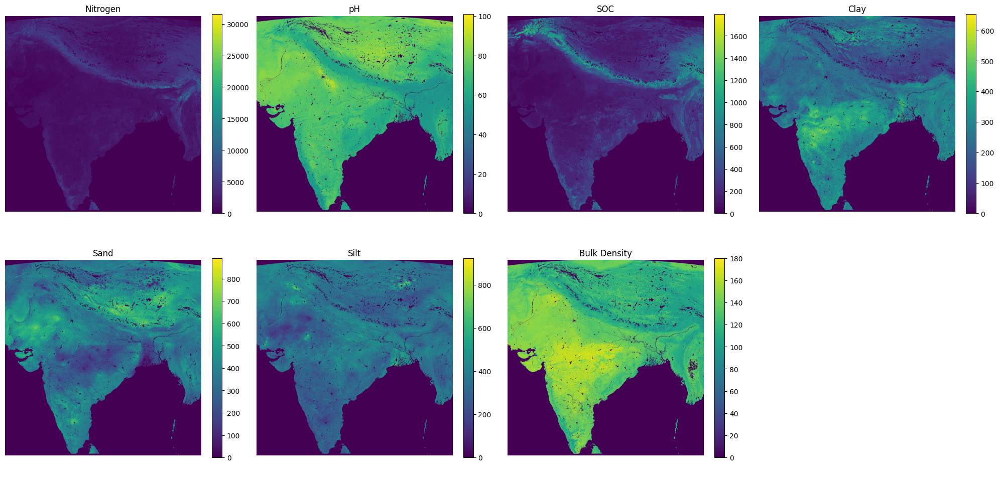

In [4]:
import rasterio
import matplotlib.pyplot as plt

tif_path = "/kaggle/input/datasets/tmleyncodes/agriculture-dataset/agriculture_dataset/india_soil_7bands.tif"

src = rasterio.open(tif_path)

band_names = [
    "Nitrogen",
    "pH",
    "SOC",
    "Clay",
    "Sand",
    "Silt",
    "Bulk Density"
]

fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()

for i in range(7):
    band = src.read(i + 1)

    im = axes[i].imshow(band, cmap="viridis")
    axes[i].set_title(band_names[i])
    axes[i].axis("off")

    plt.colorbar(im, ax=axes[i], fraction=0.046)

axes[7].axis("off")

plt.tight_layout()
plt.show()

In [5]:
import rasterio

tif_path = "/kaggle/input/datasets/tmleyncodes/agriculture-dataset/agriculture_dataset/india_soil_7bands.tif"

src = rasterio.open(tif_path)

print("=== FULL METADATA ===\n")
print(src.meta)

print("\n=== DATA TYPES ===")
print(src.dtypes)

print("\n=== TRANSFORM ===")
print(src.transform)

print("\n=== BOUNDS ===")
print(src.bounds)

=== FULL METADATA ===

{'driver': 'GTiff', 'dtype': 'int16', 'nodata': None, 'width': 13359, 'height': 13341, 'count': 7, 'crs': CRS.from_wkt('GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AXIS["Latitude",NORTH],AXIS["Longitude",EAST],AUTHORITY["EPSG","4326"]]'), 'transform': Affine(0.002245788210298804, 0.0, 66.99859967784421,
       0.0, -0.002245788210298804, 37.96055811868068)}

=== DATA TYPES ===
('int16', 'int16', 'int16', 'int16', 'int16', 'int16', 'int16')

=== TRANSFORM ===
| 0.00, 0.00, 67.00|
| 0.00,-0.00, 37.96|
| 0.00, 0.00, 1.00|

=== BOUNDS ===
BoundingBox(left=66.99859967784421, bottom=7.99949760508434, right=97.00008437922594, top=37.96055811868068)


In [6]:
import rasterio
import numpy as np

tif_path = "/kaggle/input/datasets/tmleyncodes/agriculture-dataset/agriculture_dataset/india_soil_7bands.tif"

with rasterio.open(tif_path) as src:
    raster = src.read()

print("=== RASTER ARRAY INFO ===")
print("Shape:", raster.shape)
print("Datatype:", raster.dtype)

print("\n=== MEMORY CHECK ===")
print(f"Total Elements: {raster.size:,}")
print(f"Approx Memory: {raster.nbytes / 1e9:.2f} GB")

=== RASTER ARRAY INFO ===
Shape: (7, 13341, 13359)
Datatype: int16

=== MEMORY CHECK ===
Total Elements: 1,247,556,933
Approx Memory: 2.50 GB


=== PATCH INFO ===
Patch Shape: (7, 32, 32)
Datatype: int16


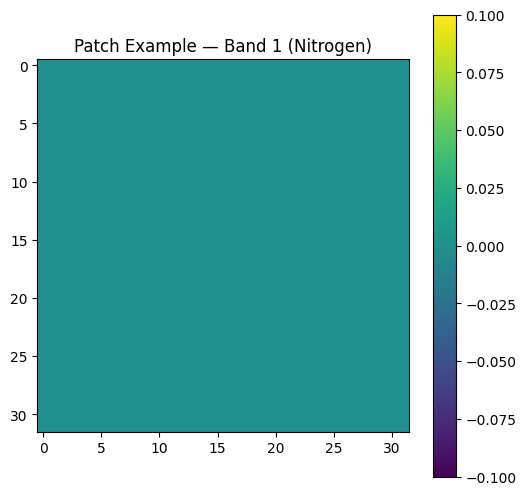

In [7]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt

PATCH_SIZE = 32

tif_path = "/kaggle/input/datasets/tmleyncodes/agriculture-dataset/agriculture_dataset/india_soil_7bands.tif"

with rasterio.open(tif_path) as src:
    raster = src.read()

# Extract first patch
patch = raster[:, 0:PATCH_SIZE, 0:PATCH_SIZE]

print("=== PATCH INFO ===")
print("Patch Shape:", patch.shape)
print("Datatype:", patch.dtype)

# Visualize first band
plt.figure(figsize=(6,6))
plt.imshow(patch[0], cmap="viridis")
plt.title("Patch Example — Band 1 (Nitrogen)")
plt.colorbar()
plt.show()

=== CENTRAL PATCH INFO ===
Shape: (7, 32, 32)


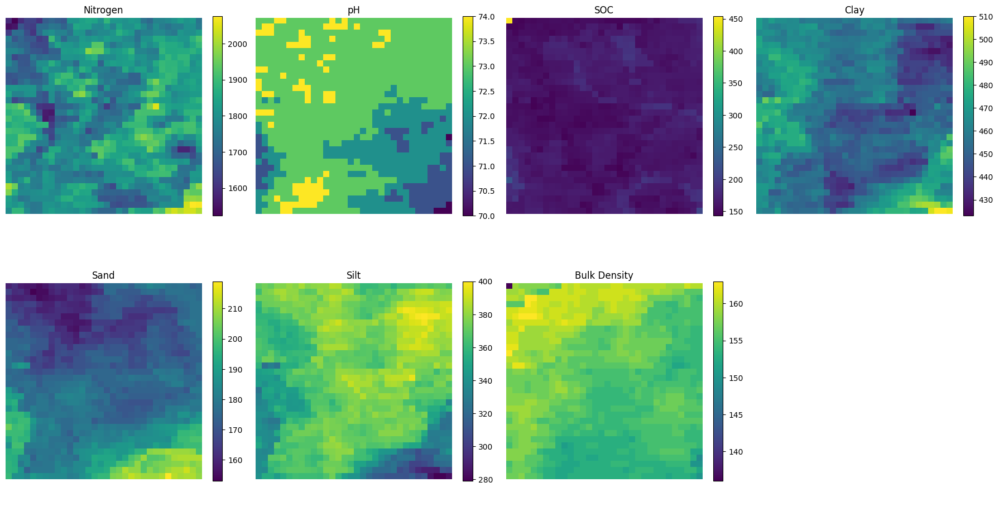

In [8]:
import rasterio
import matplotlib.pyplot as plt

PATCH_SIZE = 32

tif_path = "/kaggle/input/datasets/tmleyncodes/agriculture-dataset/agriculture_dataset/india_soil_7bands.tif"

with rasterio.open(tif_path) as src:
    raster = src.read()

# Approximate central India coordinates
center_y = 7000
center_x = 7000

patch = raster[
    :,
    center_y:center_y + PATCH_SIZE,
    center_x:center_x + PATCH_SIZE
]

print("=== CENTRAL PATCH INFO ===")
print("Shape:", patch.shape)

# Visualize all 7 bands
band_names = [
    "Nitrogen",
    "pH",
    "SOC",
    "Clay",
    "Sand",
    "Silt",
    "Bulk Density"
]

fig, axes = plt.subplots(2, 4, figsize=(18, 10))
axes = axes.flatten()

for i in range(7):
    im = axes[i].imshow(patch[i], cmap="viridis")
    axes[i].set_title(band_names[i])
    axes[i].axis("off")
    plt.colorbar(im, ax=axes[i], fraction=0.046)

axes[7].axis("off")

plt.tight_layout()
plt.show()

In [9]:
import rasterio
import numpy as np

PATCH_SIZE = 32
STRIDE = 16

tif_path = "/kaggle/input/datasets/tmleyncodes/agriculture-dataset/agriculture_dataset/india_soil_7bands.tif"

with rasterio.open(tif_path) as src:
    raster = src.read()

patches = []

_, H, W = raster.shape

for y in range(0, H - PATCH_SIZE, STRIDE):
    for x in range(0, W - PATCH_SIZE, STRIDE):

        patch = raster[
            :,
            y:y + PATCH_SIZE,
            x:x + PATCH_SIZE
        ]

        # Skip mostly empty patches
        if np.mean(patch) > 0:
            patches.append(patch)

        # Limit for testing
        if len(patches) >= 100:
            break

    if len(patches) >= 100:
        break

patches = np.array(patches)

print("=== PATCH DATASET INFO ===")
print("Patch Dataset Shape:", patches.shape)
print("Datatype:", patches.dtype)

print("\nSingle Patch Shape:", patches[0].shape)

=== PATCH DATASET INFO ===
Patch Dataset Shape: (100, 7, 32, 32)
Datatype: int16

Single Patch Shape: (7, 32, 32)


Random Patch Index: 46
Patch Shape: (7, 32, 32)


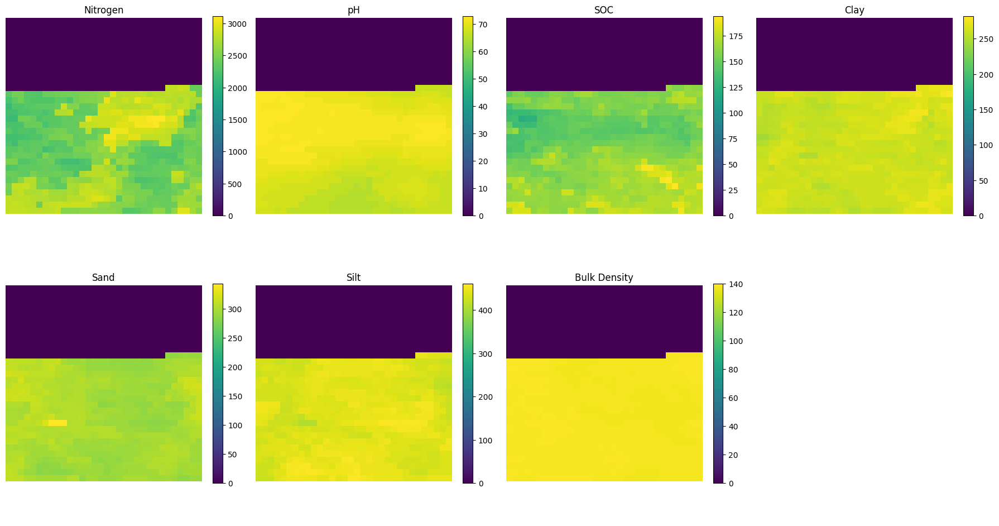

In [10]:
import random
import matplotlib.pyplot as plt

band_names = [
    "Nitrogen",
    "pH",
    "SOC",
    "Clay",
    "Sand",
    "Silt",
    "Bulk Density"
]

# Pick random patch
idx = random.randint(0, len(patches)-1)

sample = patches[idx]

print("Random Patch Index:", idx)
print("Patch Shape:", sample.shape)

fig, axes = plt.subplots(2, 4, figsize=(18, 10))
axes = axes.flatten()

for i in range(7):
    im = axes[i].imshow(sample[i], cmap="viridis")
    axes[i].set_title(band_names[i])
    axes[i].axis("off")
    plt.colorbar(im, ax=axes[i], fraction=0.046)

axes[7].axis("off")

plt.tight_layout()
plt.show()

In [11]:
import rasterio
import numpy as np

PATCH_SIZE = 32
STRIDE = 16
MAX_PATCHES = 5000

tif_path = "/kaggle/input/datasets/tmleyncodes/agriculture-dataset/agriculture_dataset/india_soil_7bands.tif"

with rasterio.open(tif_path) as src:
    raster = src.read()

patches = []

_, H, W = raster.shape

count = 0

for y in range(0, H - PATCH_SIZE, STRIDE):

    for x in range(0, W - PATCH_SIZE, STRIDE):

        patch = raster[
            :,
            y:y + PATCH_SIZE,
            x:x + PATCH_SIZE
        ]

        # Skip mostly empty patches
        if np.mean(patch) > 0:
            patches.append(patch)
            count += 1

        if count >= MAX_PATCHES:
            break

    if count >= MAX_PATCHES:
        break

patches = np.array(patches)

print("=== FINAL PATCH DATASET ===")
print("Shape:", patches.shape)
print("Datatype:", patches.dtype)

print(f"\nTotal Memory: {patches.nbytes / 1e9:.2f} GB")

=== FINAL PATCH DATASET ===
Shape: (5000, 7, 32, 32)
Datatype: int16

Total Memory: 0.07 GB


In [12]:
import numpy as np

band_names = [
    "Nitrogen",
    "pH",
    "SOC",
    "Clay",
    "Sand",
    "Silt",
    "Bulk Density"
]

print("=== CHANNEL STATISTICS ===\n")

for i in range(7):

    channel = patches[:, i, :, :]

    mean = np.mean(channel)
    std = np.std(channel)
    min_val = np.min(channel)
    max_val = np.max(channel)

    print(f"{band_names[i]}")
    print(f"Mean: {mean:.2f}")
    print(f"Std: {std:.2f}")
    print(f"Min: {min_val}")
    print(f"Max: {max_val}")
    print("-" * 40)

=== CHANNEL STATISTICS ===

Nitrogen
Mean: 2251.56
Std: 1047.23
Min: 0
Max: 6350
----------------------------------------
pH
Mean: 67.81
Std: 22.59
Min: 0
Max: 84
----------------------------------------
SOC
Mean: 162.91
Std: 125.67
Min: 0
Max: 1225
----------------------------------------
Clay
Mean: 238.81
Std: 94.85
Min: 0
Max: 510
----------------------------------------
Sand
Mean: 322.50
Std: 115.31
Min: 0
Max: 651
----------------------------------------
Silt
Mean: 341.11
Std: 121.52
Min: 0
Max: 536
----------------------------------------
Bulk Density
Mean: 118.83
Std: 40.08
Min: 0
Max: 146
----------------------------------------


In [13]:
import numpy as np

# Convert to float32 first
patches_float = patches.astype(np.float32)

normalized_patches = np.zeros_like(patches_float)

band_names = [
    "Nitrogen",
    "pH",
    "SOC",
    "Clay",
    "Sand",
    "Silt",
    "Bulk Density"
]

print("=== NORMALIZATION INFO ===\n")

for i in range(7):

    channel = patches_float[:, i, :, :]

    mean = np.mean(channel)
    std = np.std(channel)

    normalized_channel = (channel - mean) / std

    normalized_patches[:, i, :, :] = normalized_channel

    print(f"{band_names[i]}")
    print(f"Original Mean: {mean:.2f}")
    print(f"Original Std: {std:.2f}")

    print(f"Normalized Mean: {np.mean(normalized_channel):.4f}")
    print(f"Normalized Std: {np.std(normalized_channel):.4f}")

    print("-" * 40)

print("\nFINAL DATASET SHAPE:", normalized_patches.shape)
print("Datatype:", normalized_patches.dtype)

=== NORMALIZATION INFO ===

Nitrogen
Original Mean: 2251.56
Original Std: 1047.23
Normalized Mean: -0.0000
Normalized Std: 1.0000
----------------------------------------
pH
Original Mean: 67.81
Original Std: 22.59
Normalized Mean: -0.0000
Normalized Std: 1.0000
----------------------------------------
SOC
Original Mean: 162.91
Original Std: 125.67
Normalized Mean: 0.0000
Normalized Std: 1.0000
----------------------------------------
Clay
Original Mean: 238.81
Original Std: 94.85
Normalized Mean: -0.0000
Normalized Std: 1.0000
----------------------------------------
Sand
Original Mean: 322.50
Original Std: 115.31
Normalized Mean: 0.0000
Normalized Std: 1.0000
----------------------------------------
Silt
Original Mean: 341.11
Original Std: 121.52
Normalized Mean: -0.0000
Normalized Std: 1.0000
----------------------------------------
Bulk Density
Original Mean: 118.83
Original Std: 40.08
Normalized Mean: -0.0000
Normalized Std: 1.0000
----------------------------------------

FINAL D

In [14]:
import rasterio
import numpy as np

# =========================
# PATCH GENERATION
# =========================

PATCH_SIZE = 32
STRIDE = 16
MAX_PATCHES = 5000

tif_path = "/kaggle/input/datasets/tmleyncodes/agriculture-dataset/agriculture_dataset/india_soil_7bands.tif"

with rasterio.open(tif_path) as src:
    raster = src.read()

patches = []

_, H, W = raster.shape

count = 0

for y in range(0, H - PATCH_SIZE, STRIDE):

    for x in range(0, W - PATCH_SIZE, STRIDE):

        patch = raster[
            :,
            y:y + PATCH_SIZE,
            x:x + PATCH_SIZE
        ]

        if np.mean(patch) > 0:
            patches.append(patch)
            count += 1

        if count >= MAX_PATCHES:
            break

    if count >= MAX_PATCHES:
        break

patches = np.array(patches)

print("=== PATCH DATASET RECOVERED ===")
print("Shape:", patches.shape)

# =========================
# NORMALIZATION
# =========================

patches_float = patches.astype(np.float32)

normalized_patches = np.zeros_like(patches_float)

band_names = [
    "Nitrogen",
    "pH",
    "SOC",
    "Clay",
    "Sand",
    "Silt",
    "Bulk Density"
]

print("\n=== NORMALIZATION INFO ===\n")

for i in range(7):

    channel = patches_float[:, i, :, :]

    mean = np.mean(channel)
    std = np.std(channel)

    normalized_channel = (channel - mean) / std

    normalized_patches[:, i, :, :] = normalized_channel

    print(f"{band_names[i]}")
    print(f"Original Mean: {mean:.2f}")
    print(f"Original Std: {std:.2f}")

    print(f"Normalized Mean: {np.mean(normalized_channel):.4f}")
    print(f"Normalized Std: {np.std(normalized_channel):.4f}")

    print("-" * 40)

print("\n=== FINAL NORMALIZED DATASET ===")
print("Shape:", normalized_patches.shape)
print("Datatype:", normalized_patches.dtype)

=== PATCH DATASET RECOVERED ===
Shape: (5000, 7, 32, 32)

=== NORMALIZATION INFO ===

Nitrogen
Original Mean: 2251.56
Original Std: 1047.23
Normalized Mean: -0.0000
Normalized Std: 1.0000
----------------------------------------
pH
Original Mean: 67.81
Original Std: 22.59
Normalized Mean: -0.0000
Normalized Std: 1.0000
----------------------------------------
SOC
Original Mean: 162.91
Original Std: 125.67
Normalized Mean: 0.0000
Normalized Std: 1.0000
----------------------------------------
Clay
Original Mean: 238.81
Original Std: 94.85
Normalized Mean: -0.0000
Normalized Std: 1.0000
----------------------------------------
Sand
Original Mean: 322.50
Original Std: 115.31
Normalized Mean: 0.0000
Normalized Std: 1.0000
----------------------------------------
Silt
Original Mean: 341.11
Original Std: 121.52
Normalized Mean: -0.0000
Normalized Std: 1.0000
----------------------------------------
Bulk Density
Original Mean: 118.83
Original Std: 40.08
Normalized Mean: -0.0000
Normalized Std

In [15]:
import numpy as np
import os

save_dir = "/kaggle/working"

save_path = os.path.join(save_dir, "normalized_geospatial_patches.npy")

np.save(save_path, normalized_patches)

print("=== DATASET SAVED SUCCESSFULLY ===")
print("Path:", save_path)

# Verify save
loaded = np.load(save_path)

print("\n=== VERIFICATION ===")
print("Loaded Shape:", loaded.shape)
print("Datatype:", loaded.dtype)

=== DATASET SAVED SUCCESSFULLY ===
Path: /kaggle/working/normalized_geospatial_patches.npy

=== VERIFICATION ===
Loaded Shape: (5000, 7, 32, 32)
Datatype: float32


Random Patch Index: 4524
Patch Shape: (7, 32, 32)


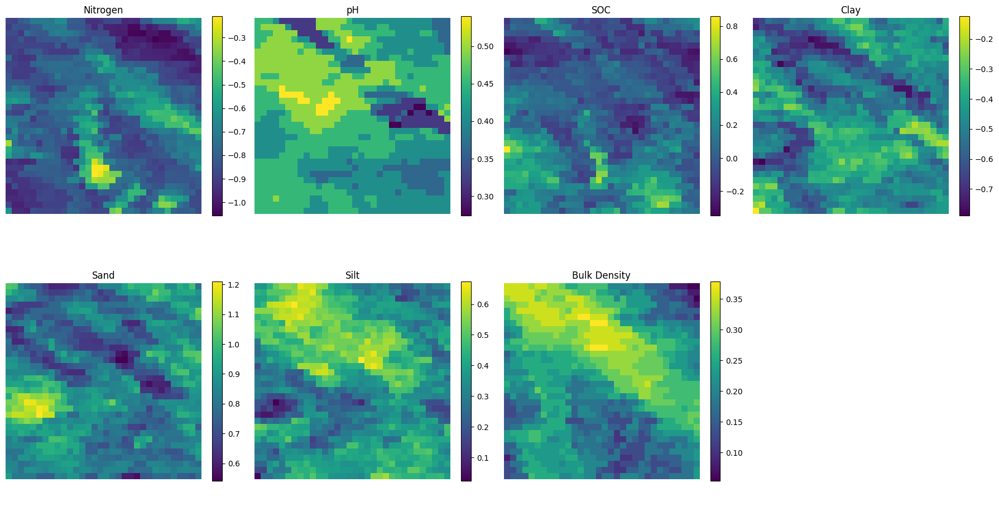

In [16]:
import matplotlib.pyplot as plt
import random

band_names = [
    "Nitrogen",
    "pH",
    "SOC",
    "Clay",
    "Sand",
    "Silt",
    "Bulk Density"
]

# Random normalized sample
idx = random.randint(0, len(normalized_patches)-1)

sample = normalized_patches[idx]

print("Random Patch Index:", idx)
print("Patch Shape:", sample.shape)

fig, axes = plt.subplots(2, 4, figsize=(18, 10))
axes = axes.flatten()

for i in range(7):

    im = axes[i].imshow(sample[i], cmap="viridis")

    axes[i].set_title(band_names[i])
    axes[i].axis("off")

    plt.colorbar(im, ax=axes[i], fraction=0.046)

axes[7].axis("off")

plt.tight_layout()
plt.show()

In [17]:
import torch
from torch.utils.data import TensorDataset

# Convert numpy -> torch tensor
tensor_data = torch.tensor(normalized_patches)

print("=== TORCH DATASET INFO ===")
print("Tensor Shape:", tensor_data.shape)
print("Datatype:", tensor_data.dtype)

# Create TensorDataset
dataset = TensorDataset(tensor_data)

print("\nDataset Length:", len(dataset))

# Inspect one sample
sample = dataset[0][0]

print("\nSingle Sample Shape:", sample.shape)
print("Single Sample Type:", sample.dtype)

=== TORCH DATASET INFO ===
Tensor Shape: torch.Size([5000, 7, 32, 32])
Datatype: torch.float32

Dataset Length: 5000

Single Sample Shape: torch.Size([7, 32, 32])
Single Sample Type: torch.float32


In [18]:
from torch.utils.data import random_split, DataLoader

# Split sizes
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size

# Random split
train_dataset, val_dataset = random_split(
    dataset,
    [train_size, val_size]
)

print("=== DATA SPLIT INFO ===")
print("Train Size:", len(train_dataset))
print("Validation Size:", len(val_dataset))

# Create DataLoaders
BATCH_SIZE = 32

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False
)

# Inspect one batch
batch = next(iter(train_loader))[0]

print("\n=== BATCH INFO ===")
print("Batch Shape:", batch.shape)
print("Batch Datatype:", batch.dtype)

=== DATA SPLIT INFO ===
Train Size: 4000
Validation Size: 1000

=== BATCH INFO ===
Batch Shape: torch.Size([32, 7, 32, 32])
Batch Datatype: torch.float32


In [19]:
import torch
import torch.nn as nn

class GeoCNN(nn.Module):

    def __init__(self):

        super().__init__()

        self.features = nn.Sequential(

            nn.Conv2d(7, 32, kernel_size=3, padding=1),
            nn.ReLU(),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(),

            nn.MaxPool2d(2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(),

            nn.AdaptiveAvgPool2d((1,1))
        )

        self.fc = nn.Linear(128, 64)

    def forward(self, x):

        x = self.features(x)

        x = x.view(x.size(0), -1)

        x = self.fc(x)

        return x

# Initialize model
model = GeoCNN()

print(model)

# Test forward pass
batch = next(iter(train_loader))[0]

output = model(batch)

print("\n=== MODEL OUTPUT ===")
print("Input Shape:", batch.shape)
print("Output Shape:", output.shape)

GeoCNN(
  (features): Sequential(
    (0): Conv2d(7, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU()
    (7): AdaptiveAvgPool2d(output_size=(1, 1))
  )
  (fc): Linear(in_features=128, out_features=64, bias=True)
)

=== MODEL OUTPUT ===
Input Shape: torch.Size([32, 7, 32, 32])
Output Shape: torch.Size([32, 64])


In [20]:
import torch
import torch.nn as nn

class GeoAutoencoder(nn.Module):

    def __init__(self):

        super().__init__()

        # Encoder
        self.encoder = nn.Sequential(

            nn.Conv2d(7, 32, 3, padding=1),
            nn.ReLU(),

            nn.Conv2d(32, 64, 3, padding=1),
            nn.ReLU(),

            nn.MaxPool2d(2),

            nn.Conv2d(64, 128, 3, padding=1),
            nn.ReLU()
        )

        # Decoder
        self.decoder = nn.Sequential(

            nn.ConvTranspose2d(128, 64, 2, stride=2),
            nn.ReLU(),

            nn.Conv2d(64, 32, 3, padding=1),
            nn.ReLU(),

            nn.Conv2d(32, 7, 3, padding=1)
        )

    def forward(self, x):

        latent = self.encoder(x)

        reconstructed = self.decoder(latent)

        return reconstructed

# Initialize model
autoencoder = GeoAutoencoder()

# Test forward pass
batch = next(iter(train_loader))[0]

reconstructed = autoencoder(batch)

print("=== AUTOENCODER TEST ===")
print("Input Shape:", batch.shape)
print("Reconstructed Shape:", reconstructed.shape)

=== AUTOENCODER TEST ===
Input Shape: torch.Size([32, 7, 32, 32])
Reconstructed Shape: torch.Size([32, 7, 32, 32])


In [21]:
import torch
import torch.nn as nn
import torch.optim as optim

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print("Using Device:", device)

# Move model to GPU
autoencoder = autoencoder.to(device)

# Loss + Optimizer
criterion = nn.MSELoss()

optimizer = optim.Adam(
    autoencoder.parameters(),
    lr=1e-3
)

# =========================
# TRAINING LOOP
# =========================

EPOCHS = 5

for epoch in range(EPOCHS):

    autoencoder.train()

    running_loss = 0.0

    for batch in train_loader:

        inputs = batch[0].to(device)

        optimizer.zero_grad()

        outputs = autoencoder(inputs)

        loss = criterion(outputs, inputs)

        loss.backward()

        optimizer.step()

        running_loss += loss.item()

    avg_loss = running_loss / len(train_loader)

    print(f"Epoch [{epoch+1}/{EPOCHS}]  Loss: {avg_loss:.6f}")

Using Device: cuda
Epoch [1/5]  Loss: 0.172582
Epoch [2/5]  Loss: 0.041393
Epoch [3/5]  Loss: 0.025896
Epoch [4/5]  Loss: 0.023700
Epoch [5/5]  Loss: 0.029233


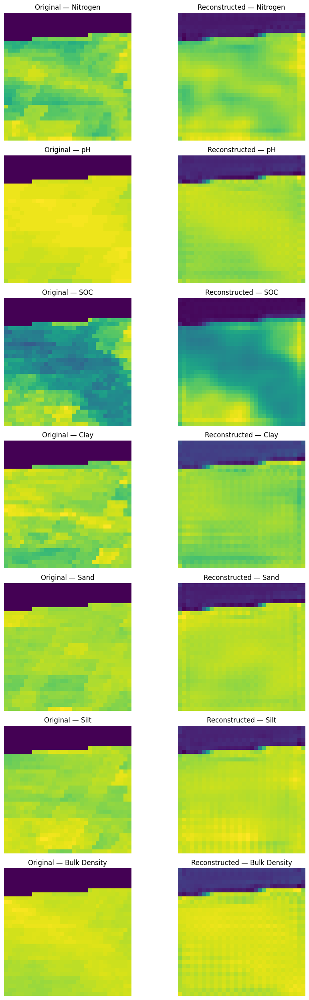

In [22]:
import matplotlib.pyplot as plt

# Get one batch
batch = next(iter(val_loader))[0].to(device)

# Reconstruction
autoencoder.eval()

with torch.no_grad():
    reconstructed = autoencoder(batch)

# Move back to CPU
original = batch[0].cpu().numpy()
recon = reconstructed[0].cpu().numpy()

band_names = [
    "Nitrogen",
    "pH",
    "SOC",
    "Clay",
    "Sand",
    "Silt",
    "Bulk Density"
]

fig, axes = plt.subplots(7, 2, figsize=(10, 25))

for i in range(7):

    axes[i,0].imshow(original[i], cmap="viridis")
    axes[i,0].set_title(f"Original — {band_names[i]}")
    axes[i,0].axis("off")

    axes[i,1].imshow(recon[i], cmap="viridis")
    axes[i,1].set_title(f"Reconstructed — {band_names[i]}")
    axes[i,1].axis("off")

plt.tight_layout()
plt.show()

In [23]:
import torch

# Put encoder in eval mode
autoencoder.eval()

# Get one validation batch
batch = next(iter(val_loader))[0].to(device)

with torch.no_grad():

    latent = autoencoder.encoder(batch)

print("=== LATENT REPRESENTATION INFO ===")
print("Input Shape:", batch.shape)
print("Latent Shape:", latent.shape)

# Flatten latent vectors
latent_flat = latent.view(latent.size(0), -1)

print("\nFlattened Latent Shape:", latent_flat.shape)

=== LATENT REPRESENTATION INFO ===
Input Shape: torch.Size([32, 7, 32, 32])
Latent Shape: torch.Size([32, 128, 16, 16])

Flattened Latent Shape: torch.Size([32, 32768])


=== PCA INFO ===
Original Shape: (32, 32768)
Reduced Shape: (32, 2)


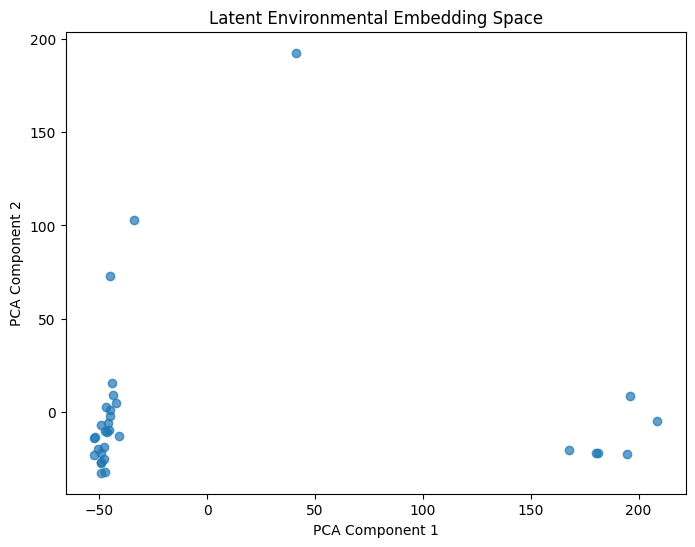

In [24]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

# Move latent vectors to CPU
latent_np = latent_flat.cpu().numpy()

# PCA reduction
pca = PCA(n_components=2)

latent_2d = pca.fit_transform(latent_np)

print("=== PCA INFO ===")
print("Original Shape:", latent_np.shape)
print("Reduced Shape:", latent_2d.shape)

# Plot
plt.figure(figsize=(8,6))

plt.scatter(
    latent_2d[:,0],
    latent_2d[:,1],
    alpha=0.7
)

plt.title("Latent Environmental Embedding Space")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")

plt.show()

In [25]:
import torch
import torch.nn as nn
import torch.optim as optim

# Reinitialize model
autoencoder = GeoAutoencoder().to(device)

criterion = nn.MSELoss()

optimizer = optim.Adam(
    autoencoder.parameters(),
    lr=1e-3
)

EPOCHS = 15

train_losses = []
val_losses = []

for epoch in range(EPOCHS):

    # ======================
    # TRAIN
    # ======================

    autoencoder.train()

    running_train_loss = 0.0

    for batch in train_loader:

        inputs = batch[0].to(device)

        optimizer.zero_grad()

        outputs = autoencoder(inputs)

        loss = criterion(outputs, inputs)

        loss.backward()

        optimizer.step()

        running_train_loss += loss.item()

    avg_train_loss = running_train_loss / len(train_loader)

    # ======================
    # VALIDATION
    # ======================

    autoencoder.eval()

    running_val_loss = 0.0

    with torch.no_grad():

        for batch in val_loader:

            inputs = batch[0].to(device)

            outputs = autoencoder(inputs)

            loss = criterion(outputs, inputs)

            running_val_loss += loss.item()

    avg_val_loss = running_val_loss / len(val_loader)

    train_losses.append(avg_train_loss)
    val_losses.append(avg_val_loss)

    print(
        f"Epoch [{epoch+1}/{EPOCHS}] "
        f"Train Loss: {avg_train_loss:.6f} "
        f"Val Loss: {avg_val_loss:.6f}"
    )

Epoch [1/15] Train Loss: 0.198361 Val Loss: 0.064408
Epoch [2/15] Train Loss: 0.039726 Val Loss: 0.027997
Epoch [3/15] Train Loss: 0.026224 Val Loss: 0.022080
Epoch [4/15] Train Loss: 0.021418 Val Loss: 0.018581
Epoch [5/15] Train Loss: 0.019090 Val Loss: 0.018909
Epoch [6/15] Train Loss: 0.017307 Val Loss: 0.021724
Epoch [7/15] Train Loss: 0.021606 Val Loss: 0.016602
Epoch [8/15] Train Loss: 0.015501 Val Loss: 0.013462
Epoch [9/15] Train Loss: 0.012778 Val Loss: 0.012396
Epoch [10/15] Train Loss: 0.011736 Val Loss: 0.011236
Epoch [11/15] Train Loss: 0.011514 Val Loss: 0.010869
Epoch [12/15] Train Loss: 0.010631 Val Loss: 0.010089
Epoch [13/15] Train Loss: 0.010890 Val Loss: 0.011092
Epoch [14/15] Train Loss: 0.010183 Val Loss: 0.009072
Epoch [15/15] Train Loss: 0.009317 Val Loss: 0.008752


In [26]:
import torch
import numpy as np

autoencoder.eval()

all_embeddings = []

with torch.no_grad():

    for batch in train_loader:

        inputs = batch[0].to(device)

        latent = autoencoder.encoder(inputs)

        latent_flat = latent.view(latent.size(0), -1)

        all_embeddings.append(
            latent_flat.cpu().numpy()
        )

# Combine all batches
all_embeddings = np.concatenate(all_embeddings, axis=0)

print("=== FULL EMBEDDING CORPUS ===")
print("Embedding Shape:", all_embeddings.shape)
print("Datatype:", all_embeddings.dtype)

print("\nEmbedding Vector Size:", all_embeddings.shape[1])

=== FULL EMBEDDING CORPUS ===
Embedding Shape: (4000, 32768)
Datatype: float32

Embedding Vector Size: 32768


In [27]:
from sklearn.decomposition import PCA
import numpy as np

# PCA compression
pca = PCA(n_components=256)

compressed_embeddings = pca.fit_transform(all_embeddings)

print("=== COMPRESSED EMBEDDINGS ===")
print("Original Shape:", all_embeddings.shape)
print("Compressed Shape:", compressed_embeddings.shape)

# Variance retained
explained = np.sum(pca.explained_variance_ratio_)

print(f"\nTotal Explained Variance: {explained:.4f}")

=== COMPRESSED EMBEDDINGS ===
Original Shape: (4000, 32768)
Compressed Shape: (4000, 256)

Total Explained Variance: 0.9812


In [28]:
import numpy as np
import pandas as pd

band_names = [
    "Nitrogen",
    "pH",
    "SOC",
    "Clay",
    "Sand",
    "Silt",
    "BulkDensity"
]

metadata_features = []

# Use original normalized patches
for patch in normalized_patches[:4000]:

    feature_vector = []

    for band in patch:

        feature_vector.extend([
            np.mean(band),
            np.std(band),
            np.min(band),
            np.max(band)
        ])

    metadata_features.append(feature_vector)

metadata_features = np.array(metadata_features)

# Column names
columns = []

for band in band_names:

    columns.extend([
        f"{band}_mean",
        f"{band}_std",
        f"{band}_min",
        f"{band}_max"
    ])

metadata_df = pd.DataFrame(
    metadata_features,
    columns=columns
)

print("=== METADATA TABLE INFO ===")
print("Shape:", metadata_df.shape)

metadata_df.head()

=== METADATA TABLE INFO ===
Shape: (4000, 28)


,Nitrogen_mean,Nitrogen_std,Nitrogen_min,Nitrogen_max,pH_mean,pH_std,pH_min,pH_max,SOC_mean,SOC_std,...,Sand_min,Sand_max,Silt_mean,Silt_std,Silt_min,Silt_max,BulkDensity_mean,BulkDensity_std,BulkDensity_min,BulkDensity_max
0,-2.140616,0.150212,-2.150014,0.321266,-2.989350,0.203674,-3.002104,0.274072,-1.292050,0.068015,...,-2.796912,0.082360,-2.793560,0.215606,-2.80706,0.682128,-2.951472,0.216348,-2.96502,0.503327
1,-2.102566,0.336725,-2.150014,0.506517,-2.938376,0.451537,-3.002104,0.274072,-1.274496,0.154767,...,-2.796912,0.238465,-2.741275,0.466239,-2.80706,0.682128,-2.897498,0.478440,-2.96502,0.528279
2,-2.051382,0.483811,-2.150014,0.584819,-2.871967,0.637231,-3.002104,0.274072,-1.251184,0.221372,...,-2.796912,0.238465,-2.669518,0.673798,-2.80706,0.805566,-2.826395,0.678812,-2.96502,0.528279
3,-2.012982,0.565645,-2.150014,0.594368,-2.820863,0.746523,-3.002104,0.274072,-1.234019,0.257056,...,-2.796912,0.160413,-2.612332,0.802269,-2.80706,0.813795,-2.771495,0.797114,-2.96502,0.553231
4,-1.969628,0.634086,-2.150014,0.594368,-2.757005,0.859571,-3.002104,0.274072,-1.213372,0.291301,...,-2.796912,0.047670,-2.547856,0.909261,-2.80706,0.813795,-2.704266,0.914471,-2.96502,0.553231


In [29]:
import numpy as np

# Convert metadata dataframe to numpy
metadata_array = metadata_df.values

# Concatenate embeddings + metadata
fusion_vectors = np.concatenate(
    [compressed_embeddings, metadata_array],
    axis=1
)

print("=== FUSION DATASET INFO ===")
print("Compressed Embeddings Shape:", compressed_embeddings.shape)
print("Metadata Shape:", metadata_array.shape)

print("\nFinal Fusion Shape:", fusion_vectors.shape)

print("\nFeature Breakdown:")
print("256 latent embedding features")
print("28 metadata features")
print("Total =", fusion_vectors.shape[1])

=== FUSION DATASET INFO ===
Compressed Embeddings Shape: (4000, 256)
Metadata Shape: (4000, 28)

Final Fusion Shape: (4000, 284)

Feature Breakdown:
256 latent embedding features
28 metadata features
Total = 284


=== CLUSTERING COMPLETE ===
Number of Clusters: 5


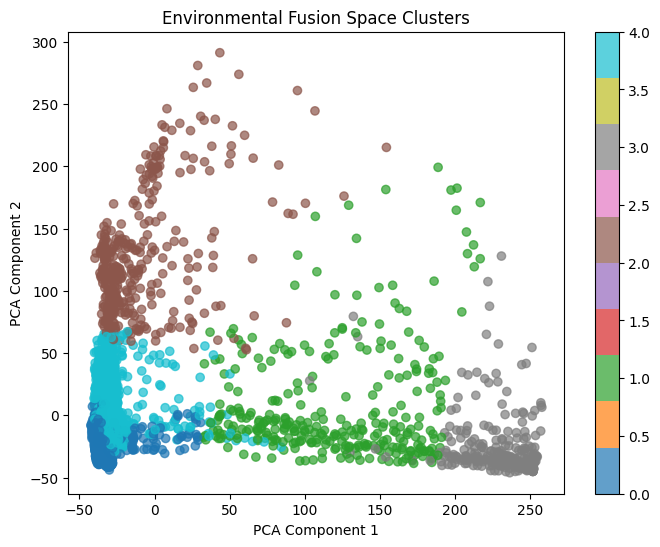

In [30]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# =========================
# KMEANS CLUSTERING
# =========================

kmeans = KMeans(
    n_clusters=5,
    random_state=42
)

cluster_labels = kmeans.fit_predict(fusion_vectors)

print("=== CLUSTERING COMPLETE ===")
print("Number of Clusters:", len(set(cluster_labels)))

# =========================
# PCA VISUALIZATION
# =========================

pca = PCA(n_components=2)

fusion_2d = pca.fit_transform(fusion_vectors)

plt.figure(figsize=(8,6))

scatter = plt.scatter(
    fusion_2d[:,0],
    fusion_2d[:,1],
    c=cluster_labels,
    cmap='tab10',
    alpha=0.7
)

plt.title("Environmental Fusion Space Clusters")

plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")

plt.colorbar(scatter)

plt.show()

In [31]:
import torch
from torch.utils.data import TensorDataset, DataLoader

# Convert to tensor
fusion_tensor = torch.tensor(
    fusion_vectors,
    dtype=torch.float32
)

print("=== FUSION TENSOR INFO ===")
print("Shape:", fusion_tensor.shape)
print("Datatype:", fusion_tensor.dtype)

# Create dataset
fusion_dataset = TensorDataset(fusion_tensor)

# DataLoader
fusion_loader = DataLoader(
    fusion_dataset,
    batch_size=32,
    shuffle=True
)

# Test batch
batch = next(iter(fusion_loader))[0]

print("\n=== BATCH INFO ===")
print("Batch Shape:", batch.shape)

=== FUSION TENSOR INFO ===
Shape: torch.Size([4000, 284])
Datatype: torch.float32

=== BATCH INFO ===
Batch Shape: torch.Size([32, 284])


In [32]:
import torch
import torch.nn as nn

class FTTransformer(nn.Module):

    def __init__(
        self,
        input_dim=284,
        embed_dim=128,
        num_heads=4,
        num_layers=2
    ):

        super().__init__()

        # Feature embedding
        self.feature_embedding = nn.Linear(
            input_dim,
            embed_dim
        )

        # Transformer encoder
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=embed_dim,
            nhead=num_heads,
            batch_first=True
        )

        self.transformer = nn.TransformerEncoder(
            encoder_layer,
            num_layers=num_layers
        )

        # Final projection
        self.output_layer = nn.Linear(
            embed_dim,
            64
        )

    def forward(self, x):

        # Embed features
        x = self.feature_embedding(x)

        # Add sequence dimension
        x = x.unsqueeze(1)

        # Transformer
        x = self.transformer(x)

        # Remove sequence dimension
        x = x.squeeze(1)

        # Final output
        x = self.output_layer(x)

        return x

# Initialize model
ft_model = FTTransformer()

# Test batch
batch = next(iter(fusion_loader))[0]

output = ft_model(batch)

print("=== FT-TRANSFORMER TEST ===")
print("Input Shape:", batch.shape)
print("Output Shape:", output.shape)

print("\nModel Created Successfully.")

=== FT-TRANSFORMER TEST ===
Input Shape: torch.Size([32, 284])
Output Shape: torch.Size([32, 64])

Model Created Successfully.


In [33]:
import torch
import torch.nn as nn

class FTTransformerAutoencoder(nn.Module):

    def __init__(
        self,
        input_dim=284,
        embed_dim=128,
        num_heads=4,
        num_layers=2
    ):

        super().__init__()

        # Encoder
        self.feature_embedding = nn.Linear(
            input_dim,
            embed_dim
        )

        encoder_layer = nn.TransformerEncoderLayer(
            d_model=embed_dim,
            nhead=num_heads,
            batch_first=True
        )

        self.transformer = nn.TransformerEncoder(
            encoder_layer,
            num_layers=num_layers
        )

        # Reconstruction head
        self.decoder = nn.Sequential(

            nn.Linear(embed_dim, 256),
            nn.ReLU(),

            nn.Linear(256, input_dim)
        )

    def forward(self, x):

        x = self.feature_embedding(x)

        x = x.unsqueeze(1)

        x = self.transformer(x)

        x = x.squeeze(1)

        reconstructed = self.decoder(x)

        return reconstructed

# Initialize model
ft_autoencoder = FTTransformerAutoencoder()

# Test batch
batch = next(iter(fusion_loader))[0]

reconstructed = ft_autoencoder(batch)

print("=== FT-TRANSFORMER AUTOENCODER ===")
print("Input Shape:", batch.shape)
print("Reconstructed Shape:", reconstructed.shape)

=== FT-TRANSFORMER AUTOENCODER ===
Input Shape: torch.Size([32, 284])
Reconstructed Shape: torch.Size([32, 284])


In [34]:
import torch
import torch.nn as nn
import torch.optim as optim

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Move model to GPU
ft_autoencoder = ft_autoencoder.to(device)

# Loss
criterion = nn.MSELoss()

# Optimizer
optimizer = optim.Adam(
    ft_autoencoder.parameters(),
    lr=1e-3
)

EPOCHS = 10

train_losses = []

for epoch in range(EPOCHS):

    ft_autoencoder.train()

    running_loss = 0.0

    for batch in fusion_loader:

        inputs = batch[0].to(device)

        optimizer.zero_grad()

        reconstructed = ft_autoencoder(inputs)

        loss = criterion(
            reconstructed,
            inputs
        )

        loss.backward()

        optimizer.step()

        running_loss += loss.item()

    avg_loss = running_loss / len(fusion_loader)

    train_losses.append(avg_loss)

    print(
        f"Epoch [{epoch+1}/{EPOCHS}] "
        f"Loss: {avg_loss:.6f}"
    )

Epoch [1/10] Loss: 28.317449
Epoch [2/10] Loss: 12.801927
Epoch [3/10] Loss: 10.188721
Epoch [4/10] Loss: 8.939713
Epoch [5/10] Loss: 8.347754
Epoch [6/10] Loss: 7.948862
Epoch [7/10] Loss: 7.415055
Epoch [8/10] Loss: 6.970669
Epoch [9/10] Loss: 6.700182
Epoch [10/10] Loss: 6.457750


In [35]:
import torch
import torch.nn as nn

class ProjectionHead(nn.Module):

    def __init__(
        self,
        input_dim=64,
        projection_dim=32
    ):

        super().__init__()

        self.projection = nn.Sequential(

            nn.Linear(input_dim, 128),
            nn.ReLU(),

            nn.Linear(128, projection_dim)
        )

    def forward(self, x):

        return self.projection(x)

# Create projection head
projection_head = ProjectionHead()

# Test FT-transformer embeddings
batch = next(iter(fusion_loader))[0]

with torch.no_grad():

    embeddings = ft_model(batch)

    projected = projection_head(embeddings)

print("=== CONTRASTIVE PROJECTION ===")
print("Transformer Embeddings:", embeddings.shape)
print("Projected Embeddings:", projected.shape)

=== CONTRASTIVE PROJECTION ===
Transformer Embeddings: torch.Size([32, 64])
Projected Embeddings: torch.Size([32, 32])


In [36]:
import torch
import torch.nn.functional as F

def nt_xent_loss(z1, z2, temperature=0.5):

    # Normalize embeddings
    z1 = F.normalize(z1, dim=1)
    z2 = F.normalize(z2, dim=1)

    # Similarity matrix
    similarity = torch.mm(z1, z2.T)

    # Targets
    labels = torch.arange(z1.size(0)).to(z1.device)

    # Scale by temperature
    similarity = similarity / temperature

    # Cross entropy loss
    loss = F.cross_entropy(similarity, labels)

    return loss

# =========================
# TEST CONTRASTIVE LOSS
# =========================

batch = next(iter(fusion_loader))[0]

with torch.no_grad():

    emb1 = projection_head(
        ft_model(batch)
    )

    emb2 = projection_head(
        ft_model(batch)
    )

loss = nt_xent_loss(emb1, emb2)

print("=== CONTRASTIVE LOSS TEST ===")
print("Loss:", loss.item())

=== CONTRASTIVE LOSS TEST ===
Loss: 2.735722541809082


In [37]:
import torch
import torch.optim as optim

# Move models to GPU
ft_model = ft_model.to(device)
projection_head = projection_head.to(device)

# Optimizer
optimizer = optim.Adam(
    list(ft_model.parameters()) +
    list(projection_head.parameters()),
    lr=1e-3
)

EPOCHS = 10

contrastive_losses = []

for epoch in range(EPOCHS):

    ft_model.train()
    projection_head.train()

    running_loss = 0.0

    for batch in fusion_loader:

        inputs = batch[0].to(device)

        # Create two noisy augmented views
        noise1 = torch.randn_like(inputs) * 0.01
        noise2 = torch.randn_like(inputs) * 0.01

        view1 = inputs + noise1
        view2 = inputs + noise2

        # Encode
        emb1 = projection_head(
            ft_model(view1)
        )

        emb2 = projection_head(
            ft_model(view2)
        )

        # Contrastive loss
        loss = nt_xent_loss(emb1, emb2)

        optimizer.zero_grad()

        loss.backward()

        optimizer.step()

        running_loss += loss.item()

    avg_loss = running_loss / len(fusion_loader)

    contrastive_losses.append(avg_loss)

    print(
        f"Epoch [{epoch+1}/{EPOCHS}] "
        f"Contrastive Loss: {avg_loss:.6f}"
    )

Epoch [1/10] Contrastive Loss: 1.934967
Epoch [2/10] Contrastive Loss: 1.841392
Epoch [3/10] Contrastive Loss: 1.814606
Epoch [4/10] Contrastive Loss: 1.802094
Epoch [5/10] Contrastive Loss: 1.790534
Epoch [6/10] Contrastive Loss: 1.774120
Epoch [7/10] Contrastive Loss: 1.770268
Epoch [8/10] Contrastive Loss: 1.765071
Epoch [9/10] Contrastive Loss: 1.761841
Epoch [10/10] Contrastive Loss: 1.754970


In [38]:
import torch
import torch.optim as optim

# Move models to GPU
ft_model = ft_model.to(device)
projection_head = projection_head.to(device)

# Optimizer
optimizer = optim.Adam(
    list(ft_model.parameters()) +
    list(projection_head.parameters()),
    lr=1e-3
)

EPOCHS = 10

contrastive_losses = []

for epoch in range(EPOCHS):

    ft_model.train()
    projection_head.train()

    running_loss = 0.0

    for batch in fusion_loader:

        inputs = batch[0].to(device)

        # Create two noisy augmented views
        noise1 = torch.randn_like(inputs) * 0.01
        noise2 = torch.randn_like(inputs) * 0.01

        view1 = inputs + noise1
        view2 = inputs + noise2

        # Encode
        emb1 = projection_head(
            ft_model(view1)
        )

        emb2 = projection_head(
            ft_model(view2)
        )

        # Contrastive loss
        loss = nt_xent_loss(emb1, emb2)

        optimizer.zero_grad()

        loss.backward()

        optimizer.step()

        running_loss += loss.item()

    avg_loss = running_loss / len(fusion_loader)

    contrastive_losses.append(avg_loss)

    print(
        f"Epoch [{epoch+1}/{EPOCHS}] "
        f"Contrastive Loss: {avg_loss:.6f}"
    )

Epoch [1/10] Contrastive Loss: 1.756689
Epoch [2/10] Contrastive Loss: 1.753477
Epoch [3/10] Contrastive Loss: 1.744663
Epoch [4/10] Contrastive Loss: 1.741372
Epoch [5/10] Contrastive Loss: 1.741254
Epoch [6/10] Contrastive Loss: 1.739924
Epoch [7/10] Contrastive Loss: 1.737055
Epoch [8/10] Contrastive Loss: 1.740757
Epoch [9/10] Contrastive Loss: 1.736167
Epoch [10/10] Contrastive Loss: 1.733390


In [39]:
import os
from collections import defaultdict

# Soil image dataset path
soil_image_path = "/kaggle/input"

# Count images by class
class_counts = defaultdict(int)

image_extensions = ('.jpg', '.jpeg', '.png')

for root, dirs, files in os.walk(soil_image_path):

    image_files = [
        f for f in files
        if f.lower().endswith(image_extensions)
    ]

    if len(image_files) > 0:

        class_name = os.path.basename(root)

        class_counts[class_name] += len(image_files)

print("=== SOIL IMAGE DATASET CLASSES ===\n")

for cls, count in sorted(class_counts.items()):

    print(f"{cls}: {count} images")

print("\nTotal Classes:", len(class_counts))
print("Total Images:", sum(class_counts.values()))

=== SOIL IMAGE DATASET CLASSES ===

Alluvial_Soil: 741 images
Arid_Soil: 553 images
Black Soil: 37 images
Black_Soil: 1422 images
Cinder Soil: 30 images
Laterite Soil: 30 images
Laterite_Soil: 432 images
Mountain_Soil: 394 images
OpenLandMap Soil Samples: 1 images
Peat Soil: 30 images
Red_Soil: 1235 images
Yellow Soil: 29 images
Yellow_Soil: 1470 images

Total Classes: 13
Total Images: 6404


In [40]:
from collections import defaultdict
import os

# Root dataset path
soil_image_path = "/kaggle/input"

# Label normalization mapping
label_mapping = {
    "Black Soil": "Black_Soil",
    "Laterite Soil": "Laterite_Soil",
    "Yellow Soil": "Yellow_Soil",
    "Peat Soil": "Peat_Soil",
    "Cinder Soil": "Cinder_Soil"
}

normalized_counts = defaultdict(int)

image_extensions = ('.jpg', '.jpeg', '.png')

for root, dirs, files in os.walk(soil_image_path):

    image_files = [
        f for f in files
        if f.lower().endswith(image_extensions)
    ]

    if len(image_files) > 0:

        class_name = os.path.basename(root)

        # Apply normalization
        class_name = label_mapping.get(
            class_name,
            class_name
        )

        normalized_counts[class_name] += len(image_files)

print("=== HARMONIZED CLASS DISTRIBUTION ===\n")

for cls, count in sorted(normalized_counts.items()):

    print(f"{cls}: {count} images")

print("\nTotal Harmonized Classes:", len(normalized_counts))
print("Total Images:", sum(normalized_counts.values()))

=== HARMONIZED CLASS DISTRIBUTION ===

Alluvial_Soil: 741 images
Arid_Soil: 553 images
Black_Soil: 1459 images
Cinder_Soil: 30 images
Laterite_Soil: 462 images
Mountain_Soil: 394 images
OpenLandMap Soil Samples: 1 images
Peat_Soil: 30 images
Red_Soil: 1235 images
Yellow_Soil: 1499 images

Total Harmonized Classes: 10
Total Images: 6404


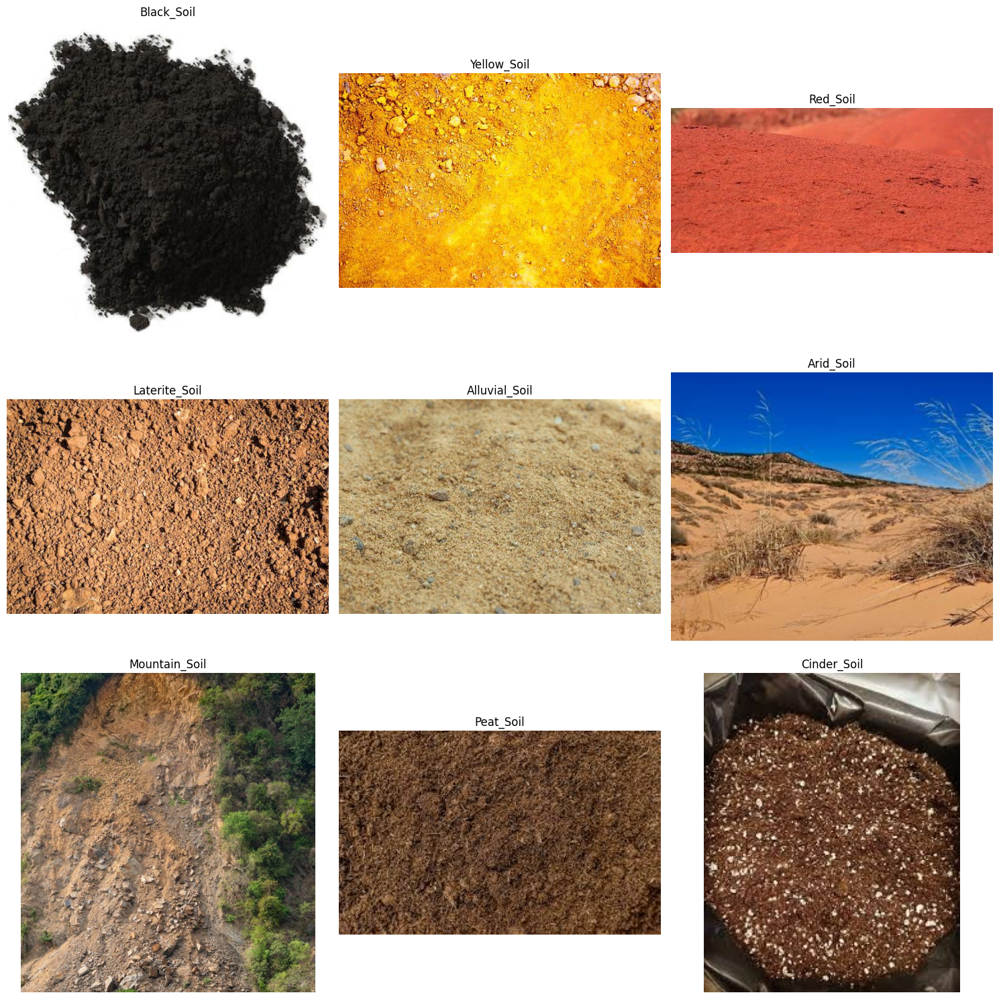

In [41]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image

# Dataset root
soil_image_path = "/kaggle/input"

# Valid harmonized classes
target_classes = [
    "Black_Soil",
    "Yellow_Soil",
    "Red_Soil",
    "Laterite_Soil",
    "Alluvial_Soil",
    "Arid_Soil",
    "Mountain_Soil",
    "Peat_Soil",
    "Cinder_Soil"
]

image_extensions = ('.jpg', '.jpeg', '.png')

class_images = {}

# Find one random image per class
for root, dirs, files in os.walk(soil_image_path):

    class_name = os.path.basename(root)

    # Normalize labels
    class_name = {
        "Black Soil": "Black_Soil",
        "Laterite Soil": "Laterite_Soil",
        "Yellow Soil": "Yellow_Soil",
        "Peat Soil": "Peat_Soil",
        "Cinder Soil": "Cinder_Soil"
    }.get(class_name, class_name)

    if class_name in target_classes:

        valid_images = [
            os.path.join(root, f)
            for f in files
            if f.lower().endswith(image_extensions)
        ]

        if len(valid_images) > 0 and class_name not in class_images:

            class_images[class_name] = random.choice(valid_images)

# =========================
# DISPLAY IMAGES
# =========================

fig, axes = plt.subplots(3, 3, figsize=(15,15))

axes = axes.flatten()

for idx, cls in enumerate(target_classes):

    img_path = class_images[cls]

    img = Image.open(img_path).convert("RGB")

    axes[idx].imshow(img)

    axes[idx].set_title(cls)

    axes[idx].axis("off")

plt.tight_layout()
plt.show()

In [42]:
import pandas as pd
import os

# Find the CSV file
for root, dirs, files in os.walk("/kaggle/input"):
    for file in files:
        if file.endswith(".csv"):
            print(os.path.join(root, file))

/kaggle/input/datasets/tmleyncodes/agriculture-dataset/agriculture_dataset/Crop Recommendation (NPK + labels)/Crop_recommendation.csv


In [43]:
import pandas as pd

# Load the CSV
df = pd.read_csv("/kaggle/input/datasets/tmleyncodes/agriculture-dataset/agriculture_dataset/Crop Recommendation (NPK + labels)/Crop_recommendation.csv")

# Explore
print("Shape:", df.shape)
print("\nColumns:", df.columns.tolist())
print("\nFirst 5 rows:")
print(df.head())
print("\nUnique crops:", df['label'].nunique())
print("\nCrop list:", sorted(df['label'].unique().tolist()))
print("\nMissing values:", df.isnull().sum().sum())
print("\nBasic stats:")
print(df.describe())

Shape: (2200, 8)

Columns: ['N', 'P', 'K', 'temperature', 'humidity', 'ph', 'rainfall', 'label']

First 5 rows:
    N   P   K  temperature   humidity        ph    rainfall label
0  90  42  43    20.879744  82.002744  6.502985  202.935536  rice
1  85  58  41    21.770462  80.319644  7.038096  226.655537  rice
2  60  55  44    23.004459  82.320763  7.840207  263.964248  rice
3  74  35  40    26.491096  80.158363  6.980401  242.864034  rice
4  78  42  42    20.130175  81.604873  7.628473  262.717340  rice

Unique crops: 22

Crop list: ['apple', 'banana', 'blackgram', 'chickpea', 'coconut', 'coffee', 'cotton', 'grapes', 'jute', 'kidneybeans', 'lentil', 'maize', 'mango', 'mothbeans', 'mungbean', 'muskmelon', 'orange', 'papaya', 'pigeonpeas', 'pomegranate', 'rice', 'watermelon']

Missing values: 0

Basic stats:
                 N            P            K  temperature     humidity  \
count  2200.000000  2200.000000  2200.000000  2200.000000  2200.000000   
mean     50.551818    53.362727    

/tmp/ipykernel_57/2065872579.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=crop_counts.index, y=crop_counts.values, palette='viridis')


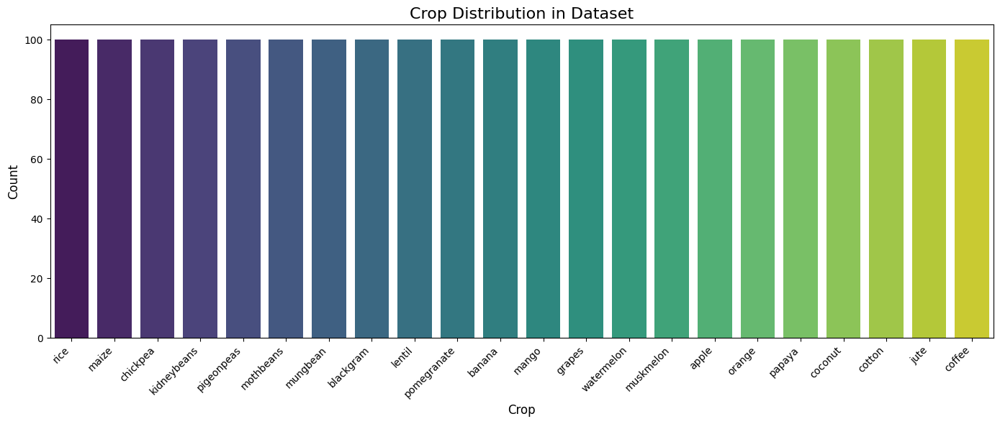

Samples per crop:
label
rice           100
maize          100
chickpea       100
kidneybeans    100
pigeonpeas     100
mothbeans      100
mungbean       100
blackgram      100
lentil         100
pomegranate    100
banana         100
mango          100
grapes         100
watermelon     100
muskmelon      100
apple          100
orange         100
papaya         100
coconut        100
cotton         100
jute           100
coffee         100
Name: count, dtype: int64


In [44]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot crop distribution
plt.figure(figsize=(14, 6))
crop_counts = df['label'].value_counts()
sns.barplot(x=crop_counts.index, y=crop_counts.values, palette='viridis')
plt.title('Crop Distribution in Dataset', fontsize=16)
plt.xlabel('Crop', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

print("Samples per crop:")
print(crop_counts)

In [45]:
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
import numpy as np

# Encode crop labels to numbers
le = LabelEncoder()
df['crop_encoded'] = le.fit_transform(df['label'])

print("Label encoding:")
for i, crop in enumerate(le.classes_):
    print(f"  {i:2d} → {crop}")

# Features and target
X = df[['N', 'P', 'K', 'temperature', 'humidity', 'ph', 'rainfall']].values
y = df['crop_encoded'].values

# Split: 80% train, 10% val, 10% test
X_train, X_temp, y_train, y_temp = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y)

X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp)

print(f"\nTrain size:      {X_train.shape}")
print(f"Validation size: {X_val.shape}")
print(f"Test size:       {X_test.shape}")
print(f"\nTotal crops:     {len(le.classes_)}")

Label encoding:
   0 → apple
   1 → banana
   2 → blackgram
   3 → chickpea
   4 → coconut
   5 → coffee
   6 → cotton
   7 → grapes
   8 → jute
   9 → kidneybeans
  10 → lentil
  11 → maize
  12 → mango
  13 → mothbeans
  14 → mungbean
  15 → muskmelon
  16 → orange
  17 → papaya
  18 → pigeonpeas
  19 → pomegranate
  20 → rice
  21 → watermelon

Train size:      (1760, 7)
Validation size: (220, 7)
Test size:       (220, 7)

Total crops:     22


In [46]:
from sklearn.preprocessing import StandardScaler
import lightgbm as lgb
from sklearn.metrics import accuracy_score, classification_report

# Normalize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled   = scaler.transform(X_val)
X_test_scaled  = scaler.transform(X_test)

# Train LightGBM
model_lgb = lgb.LGBMClassifier(
    num_leaves=127,
    learning_rate=0.05,
    n_estimators=1000,
    min_data_in_leaf=20,
    random_state=42,
    verbose=-1
)

model_lgb.fit(
    X_train_scaled, y_train,
    eval_set=[(X_val_scaled, y_val)],
    callbacks=[lgb.early_stopping(50), lgb.log_evaluation(100)]
)

# Evaluate
y_pred = model_lgb.predict(X_test_scaled)
acc = accuracy_score(y_test, y_pred)

print(f"\n✅ LightGBM Test Accuracy: {acc*100:.2f}%")
print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=le.classes_))

Training until validation scores don't improve for 50 rounds
[100]	valid_0's multi_logloss: 0.05332
Early stopping, best iteration is:
[68]	valid_0's multi_logloss: 0.045838

✅ LightGBM Test Accuracy: 98.64%

Classification Report:
              precision    recall  f1-score   support

       apple       1.00      1.00      1.00        10
      banana       1.00      1.00      1.00        10
   blackgram       1.00      0.90      0.95        10
    chickpea       1.00      1.00      1.00        10
     coconut       1.00      1.00      1.00        10
      coffee       1.00      1.00      1.00        10
      cotton       1.00      1.00      1.00        10
      grapes       1.00      1.00      1.00        10
        jute       0.91      1.00      0.95        10
 kidneybeans       1.00      1.00      1.00        10
      lentil       1.00      0.90      0.95        10
       maize       0.91      1.00      0.95        10
       mango       1.00      1.00      1.00        10
   mothbean

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


In [47]:
import torch
import torch.nn as nn
from torchvision import transforms, datasets, models
from torch.utils.data import DataLoader
import os

# Check GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Find soil image folder
soil_path = None
for root, dirs, files in os.walk("/kaggle/input"):
    for d in dirs:
        if "7 soil" in d or "Soil Types" in d or "soil types" in d.lower():
            soil_path = os.path.join(root, d)
            print(f"Found: {soil_path}")

# Image transforms
train_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(20),
    transforms.ColorJitter(brightness=0.2),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

val_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

print("\nAvailable folders in soil path:")
if soil_path:
    for item in os.listdir(soil_path):
        print(f"  {item}")

Using device: cuda
Found: /kaggle/input/datasets/tmleyncodes/agriculture-dataset/agriculture_dataset/7 soil types, includes CycleGAN augmented version
Found: /kaggle/input/datasets/tmleyncodes/agriculture-dataset/agriculture_dataset/Soil Types
Found: /kaggle/input/datasets/tmleyncodes/agriculture-dataset/agriculture_dataset/Soil Types/Soil types

Available folders in soil path:
  Yellow Soil
  Laterite Soil
  Black Soil
  Peat Soil
  Cinder Soil


In [48]:
from torch.utils.data import random_split

# Use the larger dataset with more classes
soil_data_path = "/kaggle/input/datasets/tmleyncodes/agriculture-dataset/agriculture_dataset/7 soil types, includes CycleGAN augmented version"

print("Folders in 7-soil dataset:")
for item in os.listdir(soil_data_path):
    full_path = os.path.join(soil_data_path, item)
    if os.path.isdir(full_path):
        count = sum(len(files) for _, _, files in os.walk(full_path))
        print(f"  📁 {item} → {count} images")

Folders in 7-soil dataset:
  📁 Orignal-Dataset → 1170 images
  📁 CyAUG-Dataset → 5079 images


In [49]:
# Check classes inside both datasets
for dataset_name in ["Orignal-Dataset", "CyAUG-Dataset"]:
    full_path = os.path.join(soil_data_path, dataset_name)
    print(f"\n📁 {dataset_name}:")
    for subfolder in os.listdir(full_path):
        sub_path = os.path.join(full_path, subfolder)
        if os.path.isdir(sub_path):
            count = len([f for f in os.listdir(sub_path) 
                        if f.lower().endswith(('.jpg','.jpeg','.png'))])
            print(f"   🌱 {subfolder} → {count} images")


📁 Orignal-Dataset:
   🌱 Mountain_Soil → 197 images
   🌱 Arid_Soil → 276 images
   🌱 Laterite_Soil → 216 images
   🌱 Red_Soil → 109 images
   🌱 Black_Soil → 252 images
   🌱 Yellow_Soil → 69 images
   🌱 Alluvial_Soil → 50 images

📁 CyAUG-Dataset:
   🌱 Mountain_Soil → 197 images
   🌱 Arid_Soil → 277 images
   🌱 Laterite_Soil → 216 images
   🌱 Red_Soil → 1126 images
   🌱 Black_Soil → 1170 images
   🌱 Yellow_Soil → 1401 images
   🌱 Alluvial_Soil → 691 images


In [50]:
from torchvision import transforms, datasets, models
from torch.utils.data import DataLoader, random_split

cyaug_path = os.path.join(soil_data_path, "CyAUG-Dataset")

train_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(20),
    transforms.ColorJitter(brightness=0.2),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

val_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

full_dataset = datasets.ImageFolder(cyaug_path, transform=train_transforms)
print(f"Total images: {len(full_dataset)}")
print(f"Classes: {full_dataset.classes}")

total      = len(full_dataset)
train_size = int(0.8 * total)
val_size   = int(0.1 * total)
test_size  = total - train_size - val_size

train_dataset, val_dataset, test_dataset = random_split(
    full_dataset, [train_size, val_size, test_size],
    generator=torch.Generator().manual_seed(42))

val_dataset.dataset.transform  = val_transforms
test_dataset.dataset.transform = val_transforms

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True,  num_workers=2)
val_loader   = DataLoader(val_dataset,   batch_size=32, shuffle=False, num_workers=2)
test_loader  = DataLoader(test_dataset,  batch_size=32, shuffle=False, num_workers=2)

print(f"\nTrain: {train_size} | Val: {val_size} | Test: {test_size}")

# ← FIXED: no internet download needed
model = models.efficientnet_b0(weights=None)
model.classifier[1] = nn.Linear(model.classifier[1].in_features, 7)
model = model.to(device)

print("\n✅ EfficientNet-B0 loaded!")
print(f"Trainable params: {sum(p.numel() for p in model.parameters() if p.requires_grad):,}")

Total images: 5079
Classes: ['Alluvial_Soil', 'Arid_Soil', 'Black_Soil', 'Laterite_Soil', 'Mountain_Soil', 'Red_Soil', 'Yellow_Soil']

Train: 4063 | Val: 507 | Test: 509

✅ EfficientNet-B0 loaded!
Trainable params: 4,016,515


In [51]:
# Load EfficientNet-B0 WITHOUT pretrained weights (Kaggle blocks downloads)
model = models.efficientnet_b0(weights=None)

# Replace classifier head for 7 soil classes
model.classifier[1] = nn.Linear(model.classifier[1].in_features, 7)
model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=3e-4, weight_decay=0.01)
scheduler = torch.optim.lr_scheduler.OneCycleLR(
    optimizer, max_lr=1e-3,
    steps_per_epoch=len(train_loader),
    epochs=15
)

print("✅ EfficientNet-B0 ready (training from scratch)")
print(f"Trainable params: {sum(p.numel() for p in model.parameters() if p.requires_grad):,}")
print(f"Train batches: {len(train_loader)}")
print(f"Val batches:   {len(val_loader)}")

✅ EfficientNet-B0 ready (training from scratch)
Trainable params: 4,016,515
Train batches: 127
Val batches:   16


In [52]:
# Training loop
num_epochs = 15
best_val_acc = 0.0

for epoch in range(num_epochs):
    # ── TRAIN ──
    model.train()
    train_loss, train_correct = 0.0, 0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        scheduler.step()
        train_loss    += loss.item()
        train_correct += (outputs.argmax(1) == labels).sum().item()

    train_acc  = train_correct / len(train_dataset) * 100
    train_loss = train_loss    / len(train_loader)

    # ── VALIDATE ──
    model.eval()
    val_correct = 0

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            val_correct += (outputs.argmax(1) == labels).sum().item()

    val_acc = val_correct / len(val_dataset) * 100

    # Save best model
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(model.state_dict(), "/kaggle/working/best_soil_model.pth")

    print(f"Epoch [{epoch+1:2d}/{num_epochs}] "
          f"Loss: {train_loss:.4f} | "
          f"Train Acc: {train_acc:.2f}% | "
          f"Val Acc: {val_acc:.2f}%"
          f"{'  ← BEST' if val_acc == best_val_acc else ''}")

print(f"\n✅ Training complete! Best Val Acc: {best_val_acc:.2f}%")
print("Model saved to /kaggle/working/best_soil_model.pth")

Epoch [ 1/15] Loss: 1.4249 | Train Acc: 47.28% | Val Acc: 84.22%  ← BEST
Epoch [ 2/15] Loss: 0.5916 | Train Acc: 80.48% | Val Acc: 87.97%  ← BEST
Epoch [ 3/15] Loss: 0.4584 | Train Acc: 84.76% | Val Acc: 89.35%  ← BEST
Epoch [ 4/15] Loss: 0.4393 | Train Acc: 85.01% | Val Acc: 90.73%  ← BEST
Epoch [ 5/15] Loss: 0.4294 | Train Acc: 86.07% | Val Acc: 90.73%  ← BEST
Epoch [ 6/15] Loss: 0.3094 | Train Acc: 89.32% | Val Acc: 92.11%  ← BEST
Epoch [ 7/15] Loss: 0.3103 | Train Acc: 89.22% | Val Acc: 92.31%  ← BEST
Epoch [ 8/15] Loss: 0.2830 | Train Acc: 89.81% | Val Acc: 90.53%
Epoch [ 9/15] Loss: 0.2238 | Train Acc: 91.88% | Val Acc: 91.91%
Epoch [10/15] Loss: 0.1924 | Train Acc: 93.08% | Val Acc: 92.70%  ← BEST
Epoch [11/15] Loss: 0.1587 | Train Acc: 94.22% | Val Acc: 93.69%  ← BEST
Epoch [12/15] Loss: 0.1254 | Train Acc: 95.23% | Val Acc: 94.48%  ← BEST
Epoch [13/15] Loss: 0.1089 | Train Acc: 96.19% | Val Acc: 94.87%  ← BEST
Epoch [14/15] Loss: 0.0888 | Train Acc: 96.85% | Val Acc: 94.28%
Ep

✅ Test Accuracy: 93.71%

Classification Report:
               precision    recall  f1-score   support

Alluvial_Soil       0.94      0.94      0.94        65
    Arid_Soil       0.74      0.55      0.63        31
   Black_Soil       0.97      1.00      0.99       110
Laterite_Soil       0.58      0.88      0.70        17
Mountain_Soil       0.79      0.52      0.63        21
     Red_Soil       0.96      1.00      0.98       106
  Yellow_Soil       0.99      0.99      0.99       159

     accuracy                           0.94       509
    macro avg       0.85      0.84      0.84       509
 weighted avg       0.94      0.94      0.93       509



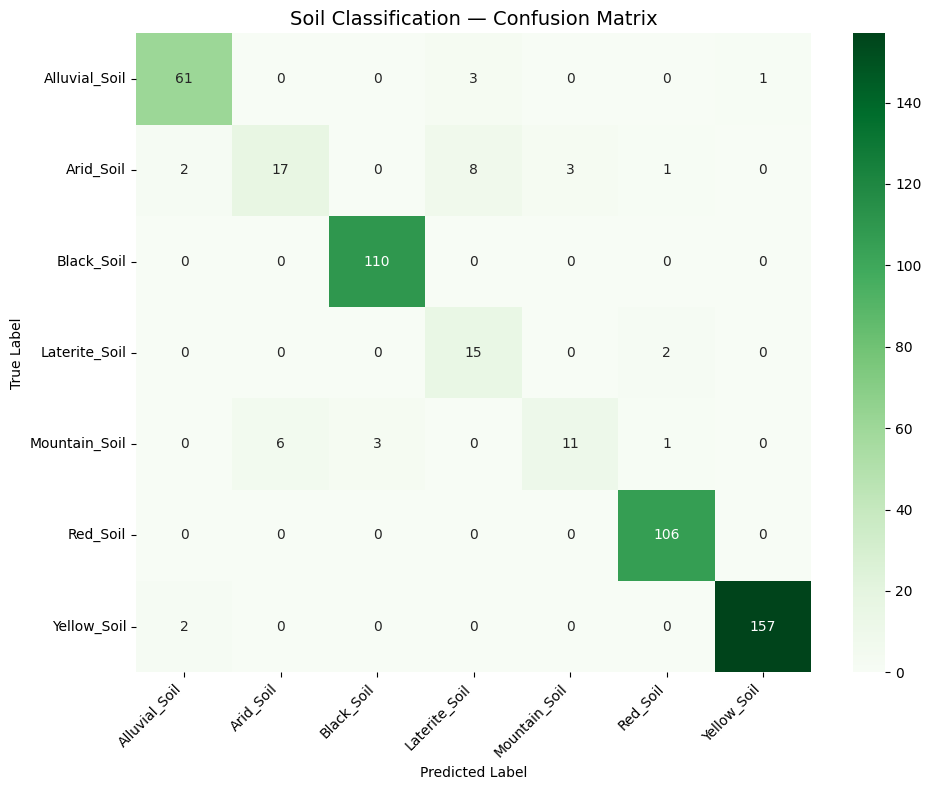

In [53]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

# Load best model
model.load_state_dict(torch.load("/kaggle/working/best_soil_model.pth"))
model.eval()

# Test evaluation
all_preds, all_labels = [], []

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        preds = outputs.argmax(1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Accuracy
test_acc = sum(p == l for p, l in zip(all_preds, all_labels)) / len(all_labels) * 100
print(f"✅ Test Accuracy: {test_acc:.2f}%")

# Classification report
soil_classes = full_dataset.classes
print("\nClassification Report:")
print(classification_report(all_labels, all_preds, target_names=soil_classes))

# Confusion matrix
cm = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Greens',
            xticklabels=soil_classes,
            yticklabels=soil_classes)
plt.title('Soil Classification — Confusion Matrix', fontsize=14)
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [54]:
import torch.nn.functional as F

# ── Cross-Modal Transformer Fusion Model ──
class AgroSense2(nn.Module):
    def __init__(self, num_tab_features=7, num_soil_classes=7, 
                 num_crops=22, tab_dim=256, img_dim=1280):
        super().__init__()

        # ── Tabular encoder (FT-style) ──
        self.tab_encoder = nn.Sequential(
            nn.Linear(num_tab_features, 128),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(128, tab_dim),
            nn.ReLU()
        )

        # ── Image encoder (EfficientNet-B0 backbone) ──
        self.img_backbone = models.efficientnet_b0(weights=None)
        self.img_backbone.classifier = nn.Identity()  # Remove head
        # Output: (B, 1280)

        # ── Project image features to tab_dim ──
        self.img_proj = nn.Linear(img_dim, tab_dim)

        # ── Cross-attention: tab attends to image ──
        self.cross_attn = nn.MultiheadAttention(
            embed_dim=tab_dim, num_heads=8, 
            dropout=0.1, batch_first=True)

        # ── Soil type classifier head ──
        self.soil_head = nn.Linear(tab_dim, num_soil_classes)

        # ── Crop recommendation head ──
        self.crop_head = nn.Sequential(
            nn.Linear(tab_dim * 2, 256),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(256, num_crops)
        )

    def forward(self, img, tab):
        # Tabular branch
        f_tab = self.tab_encoder(tab)          # (B, 256)
        f_tab_seq = f_tab.unsqueeze(1)         # (B, 1, 256)

        # Image branch
        f_img = self.img_backbone(img)         # (B, 1280)
        f_img = self.img_proj(f_img)           # (B, 256)
        f_img_seq = f_img.unsqueeze(1)         # (B, 1, 256)

        # Cross-attention: tab queries image
        f_cross, _ = self.cross_attn(
            f_tab_seq, f_img_seq, f_img_seq)   # (B, 1, 256)
        f_cross = f_cross.squeeze(1)           # (B, 256)

        # Soil prediction from image features
        soil_out = self.soil_head(f_img)       # (B, 7)

        # Fused crop prediction
        fused = torch.cat([f_cross, f_tab], dim=1)  # (B, 512)
        crop_out = self.crop_head(fused)             # (B, 22)

        return crop_out, soil_out

# Instantiate model
agrosense2 = AgroSense2().to(device)

# Load pretrained soil weights into backbone
state_dict = torch.load("/kaggle/working/best_soil_model.pth")
# Remove classifier weights (different head)
state_dict = {k: v for k, v in state_dict.items() 
              if not k.startswith('classifier')}
agrosense2.img_backbone.load_state_dict(state_dict, strict=False)

print("✅ AgroSense 2.0 Cross-Modal Transformer ready!")
total = sum(p.numel() for p in agrosense2.parameters())
print(f"Total parameters: {total:,}")

✅ AgroSense 2.0 Cross-Modal Transformer ready!
Total parameters: 4,771,737


In [55]:
from torch.utils.data import Dataset

# Soil class to index mapping
soil_class_map = {
    'Alluvial_Soil': 0, 'Arid_Soil': 1, 'Black_Soil': 2,
    'Laterite_Soil': 3, 'Mountain_Soil': 4, 'Red_Soil': 5, 'Yellow_Soil': 6
}

# ── Paired Dataset ──
class PairedSoilDataset(Dataset):
    def __init__(self, df, soil_path, transform, soil_class_map, le):
        self.transform     = transform
        self.soil_class_map = soil_class_map

        # Build image list from all soil folders
        self.image_paths = []
        self.soil_labels = []
        for soil_name, soil_idx in soil_class_map.items():
            folder = os.path.join(soil_path, soil_name)
            if os.path.exists(folder):
                for f in os.listdir(folder):
                    if f.lower().endswith(('.jpg','.jpeg','.png')):
                        self.image_paths.append(os.path.join(folder, f))
                        self.soil_labels.append(soil_idx)

        # Nutrient samples (repeat to match image count)
        self.tab_data   = torch.FloatTensor(
            scaler.transform(df[['N','P','K','temperature',
                                  'humidity','ph','rainfall']].values))
        self.crop_labels = torch.LongTensor(df['crop_encoded'].values)

        print(f"Images: {len(self.image_paths)} | "
              f"Nutrient samples: {len(self.tab_data)}")

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        # Image
        img = Image.open(self.image_paths[idx]).convert("RGB")
        img = self.transform(img)

        # Random nutrient sample (multimodal pairing)
        tab_idx  = idx % len(self.tab_data)
        tab      = self.tab_data[tab_idx]
        crop_lbl = self.crop_labels[tab_idx]
        soil_lbl = self.soil_labels[idx]

        return img, tab, crop_lbl, soil_lbl

# Create dataset
paired_dataset = PairedSoilDataset(
    df, cyaug_path, val_transforms, soil_class_map, le)

# Split
n      = len(paired_dataset)
n_train = int(0.8 * n)
n_val   = int(0.1 * n)
n_test  = n - n_train - n_val

train_p, val_p, test_p = random_split(
    paired_dataset, [n_train, n_val, n_test],
    generator=torch.Generator().manual_seed(42))

train_pl = DataLoader(train_p, batch_size=32, shuffle=True,  num_workers=2)
val_pl   = DataLoader(val_p,   batch_size=32, shuffle=False, num_workers=2)
test_pl  = DataLoader(test_p,  batch_size=32, shuffle=False, num_workers=2)

print(f"Train: {n_train} | Val: {n_val} | Test: {n_test}")

Images: 5078 | Nutrient samples: 2200
Train: 4062 | Val: 507 | Test: 509


In [56]:
from PIL import Image
from torch.utils.data import Dataset

# ── Paired Dataset (fixed) ──
class PairedSoilDataset(Dataset):
    def __init__(self, df, soil_path, transform, soil_class_map, le):
        self.transform      = transform
        self.soil_class_map = soil_class_map

        self.image_paths = []
        self.soil_labels = []
        for soil_name, soil_idx in soil_class_map.items():
            folder = os.path.join(soil_path, soil_name)
            if os.path.exists(folder):
                for f in os.listdir(folder):
                    if f.lower().endswith(('.jpg','.jpeg','.png')):
                        self.image_paths.append(os.path.join(folder, f))
                        self.soil_labels.append(soil_idx)

        self.tab_data    = torch.FloatTensor(
            scaler.transform(df[['N','P','K','temperature',
                                  'humidity','ph','rainfall']].values))
        self.crop_labels = torch.LongTensor(df['crop_encoded'].values)

        print(f"Images: {len(self.image_paths)} | "
              f"Nutrient samples: {len(self.tab_data)}")

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        from PIL import Image  # ← fix for worker processes
        img      = Image.open(self.image_paths[idx]).convert("RGB")
        img      = self.transform(img)
        tab_idx  = idx % len(self.tab_data)
        tab      = self.tab_data[tab_idx]
        crop_lbl = self.crop_labels[tab_idx]
        soil_lbl = self.soil_labels[idx]
        return img, tab, crop_lbl, soil_lbl

# Recreate dataset and loaders
paired_dataset = PairedSoilDataset(
    df, cyaug_path, val_transforms, soil_class_map, le)

n       = len(paired_dataset)
n_train = int(0.8 * n)
n_val   = int(0.1 * n)
n_test  = n - n_train - n_val

train_p, val_p, test_p = random_split(
    paired_dataset, [n_train, n_val, n_test],
    generator=torch.Generator().manual_seed(42))

train_pl = DataLoader(train_p, batch_size=32, shuffle=True,  num_workers=2)
val_pl   = DataLoader(val_p,   batch_size=32, shuffle=False, num_workers=2)
test_pl  = DataLoader(test_p,  batch_size=32, shuffle=False, num_workers=2)

print(f"✅ Dataset ready! Train: {n_train} | Val: {n_val} | Test: {n_test}")

Images: 5078 | Nutrient samples: 2200
✅ Dataset ready! Train: 4062 | Val: 507 | Test: 509


In [57]:
# Optimizer and loss
optimizer2 = torch.optim.AdamW(agrosense2.parameters(), lr=3e-4, weight_decay=0.01)
scheduler2 = torch.optim.lr_scheduler.OneCycleLR(
    optimizer2, max_lr=1e-3,
    steps_per_epoch=len(train_pl), epochs=15)

criterion_crop = nn.CrossEntropyLoss()
criterion_soil = nn.CrossEntropyLoss()
best_val_acc2  = 0.0

for epoch in range(15):
    # ── TRAIN ──
    agrosense2.train()
    train_loss, train_correct = 0.0, 0

    for imgs, tabs, crop_lbls, soil_lbls in train_pl:
        imgs      = imgs.to(device)
        tabs      = tabs.to(device)
        crop_lbls = crop_lbls.to(device)
        soil_lbls = soil_lbls.to(device)

        optimizer2.zero_grad()
        crop_out, soil_out = agrosense2(imgs, tabs)

        loss = criterion_crop(crop_out, crop_lbls) + \
               0.3 * criterion_soil(soil_out, soil_lbls)

        loss.backward()
        optimizer2.step()
        scheduler2.step()

        train_loss    += loss.item()
        train_correct += (crop_out.argmax(1) == crop_lbls).sum().item()

    train_acc  = train_correct / n_train * 100
    train_loss = train_loss    / len(train_pl)

    # ── VALIDATE ──
    agrosense2.eval()
    val_correct = 0

    with torch.no_grad():
        for imgs, tabs, crop_lbls, soil_lbls in val_pl:
            imgs      = imgs.to(device)
            tabs      = tabs.to(device)
            crop_lbls = crop_lbls.to(device)
            crop_out, _ = agrosense2(imgs, tabs)
            val_correct += (crop_out.argmax(1) == crop_lbls).sum().item()

    val_acc = val_correct / n_val * 100

    if val_acc > best_val_acc2:
        best_val_acc2 = val_acc
        torch.save(agrosense2.state_dict(),
                   "/kaggle/working/best_agrosense2.pth")

    print(f"Epoch [{epoch+1:2d}/15] "
          f"Loss: {train_loss:.4f} | "
          f"Train Acc: {train_acc:.2f}% | "
          f"Val Acc: {val_acc:.2f}%"
          f"{'  ← BEST' if val_acc == best_val_acc2 else ''}")

print(f"\n✅ AgroSense 2.0 Training Complete!")
print(f"Best Validation Accuracy: {best_val_acc2:.2f}%")

Epoch [ 1/15] Loss: 2.9791 | Train Acc: 17.60% | Val Acc: 31.76%  ← BEST
Epoch [ 2/15] Loss: 1.4571 | Train Acc: 58.17% | Val Acc: 83.43%  ← BEST
Epoch [ 3/15] Loss: 0.5104 | Train Acc: 84.34% | Val Acc: 85.40%  ← BEST
Epoch [ 4/15] Loss: 0.3883 | Train Acc: 89.12% | Val Acc: 94.48%  ← BEST
Epoch [ 5/15] Loss: 0.3174 | Train Acc: 91.58% | Val Acc: 93.29%
Epoch [ 6/15] Loss: 0.2713 | Train Acc: 92.84% | Val Acc: 98.03%  ← BEST
Epoch [ 7/15] Loss: 0.2548 | Train Acc: 93.11% | Val Acc: 97.83%
Epoch [ 8/15] Loss: 0.2077 | Train Acc: 94.39% | Val Acc: 97.44%
Epoch [ 9/15] Loss: 0.1873 | Train Acc: 94.44% | Val Acc: 96.84%
Epoch [10/15] Loss: 0.1486 | Train Acc: 95.67% | Val Acc: 97.44%
Epoch [11/15] Loss: 0.1481 | Train Acc: 95.62% | Val Acc: 99.01%  ← BEST
Epoch [12/15] Loss: 0.1239 | Train Acc: 96.45% | Val Acc: 98.03%
Epoch [13/15] Loss: 0.1056 | Train Acc: 96.75% | Val Acc: 99.21%  ← BEST
Epoch [14/15] Loss: 0.1086 | Train Acc: 96.38% | Val Acc: 99.21%  ← BEST
Epoch [15/15] Loss: 0.0929

✅ AgroSense 2.0 Final Test Accuracy: 97.64%

Classification Report:
              precision    recall  f1-score   support

       apple       1.00      1.00      1.00        18
      banana       1.00      1.00      1.00        18
   blackgram       1.00      0.89      0.94        19
    chickpea       1.00      1.00      1.00        31
     coconut       1.00      1.00      1.00        20
      coffee       1.00      1.00      1.00        13
      cotton       1.00      1.00      1.00        19
      grapes       1.00      1.00      1.00        24
        jute       0.78      0.90      0.84        20
 kidneybeans       0.94      1.00      0.97        34
      lentil       0.89      1.00      0.94        17
       maize       1.00      1.00      1.00        35
       mango       1.00      1.00      1.00        17
   mothbeans       1.00      1.00      1.00        26
    mungbean       1.00      1.00      1.00        37
   muskmelon       0.96      1.00      0.98        24
      orange 

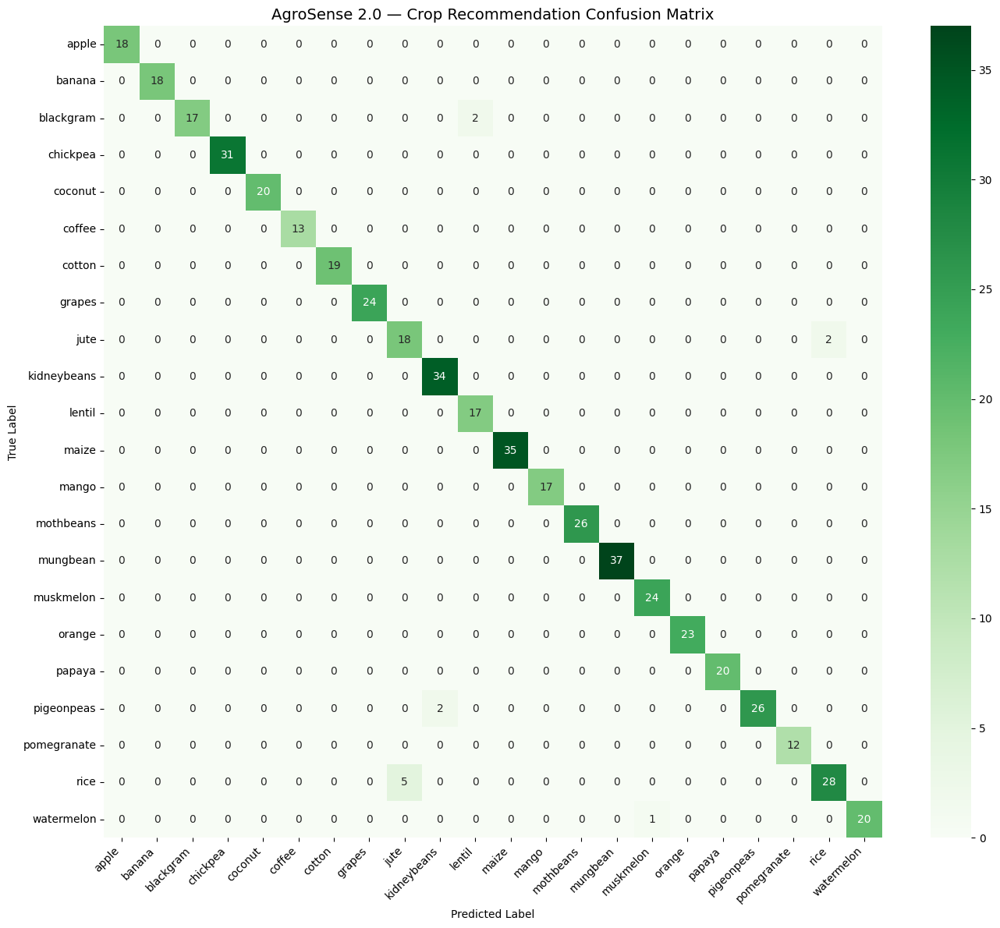

In [58]:
# Load best model
agrosense2.load_state_dict(
    torch.load("/kaggle/working/best_agrosense2.pth"))
agrosense2.eval()

all_preds, all_labels = [], []

with torch.no_grad():
    for imgs, tabs, crop_lbls, soil_lbls in test_pl:
        imgs      = imgs.to(device)
        tabs      = tabs.to(device)
        crop_lbls = crop_lbls.to(device)
        crop_out, _ = agrosense2(imgs, tabs)
        all_preds.extend(crop_out.argmax(1).cpu().numpy())
        all_labels.extend(crop_lbls.cpu().numpy())

test_acc = sum(p == l for p, l in 
               zip(all_preds, all_labels)) / len(all_labels) * 100

print(f"✅ AgroSense 2.0 Final Test Accuracy: {test_acc:.2f}%")
print("\nClassification Report:")
print(classification_report(all_labels, all_preds, 
                            target_names=le.classes_))

# Confusion matrix
cm = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(14, 12))
sns.heatmap(cm, annot=True, fmt='d', cmap='Greens',
            xticklabels=le.classes_,
            yticklabels=le.classes_)
plt.title('AgroSense 2.0 — Crop Recommendation Confusion Matrix', 
          fontsize=14)
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [59]:
import shap
import numpy as np

feature_names = ['N', 'P', 'K', 'temperature', 'humidity', 'ph', 'rainfall']

# SHAP explainer
explainer = shap.TreeExplainer(model_lgb)
shap_vals = explainer.shap_values(X_test_scaled)
shap_arr  = np.array(shap_vals)

# Debug shapes
print(f"shap_arr shape: {shap_arr.shape}")
print(f"Type: {type(shap_vals)}")
if isinstance(shap_vals, list):
    print(f"List length: {len(shap_vals)}")
    print(f"Each element shape: {np.array(shap_vals[0]).shape}")

shap_arr shape: (220, 7, 22)
Type: <class 'numpy.ndarray'>


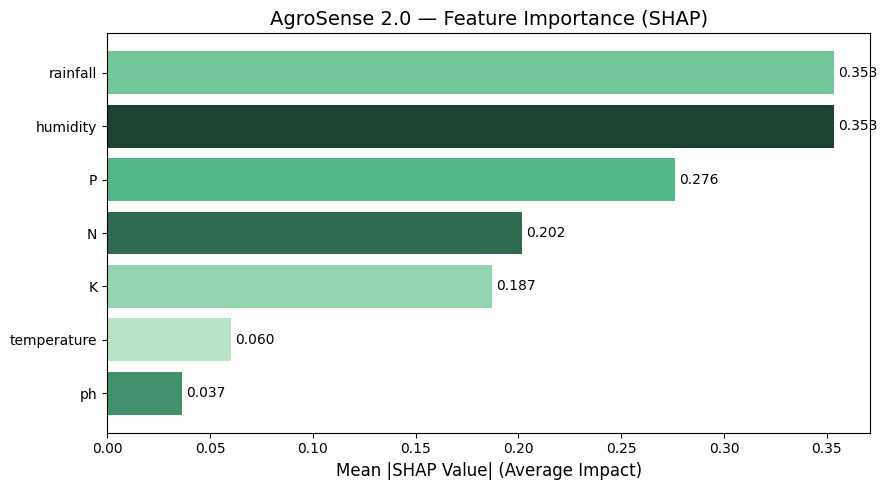

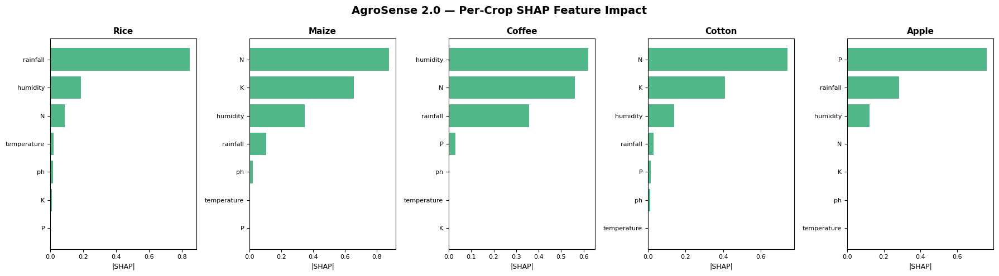

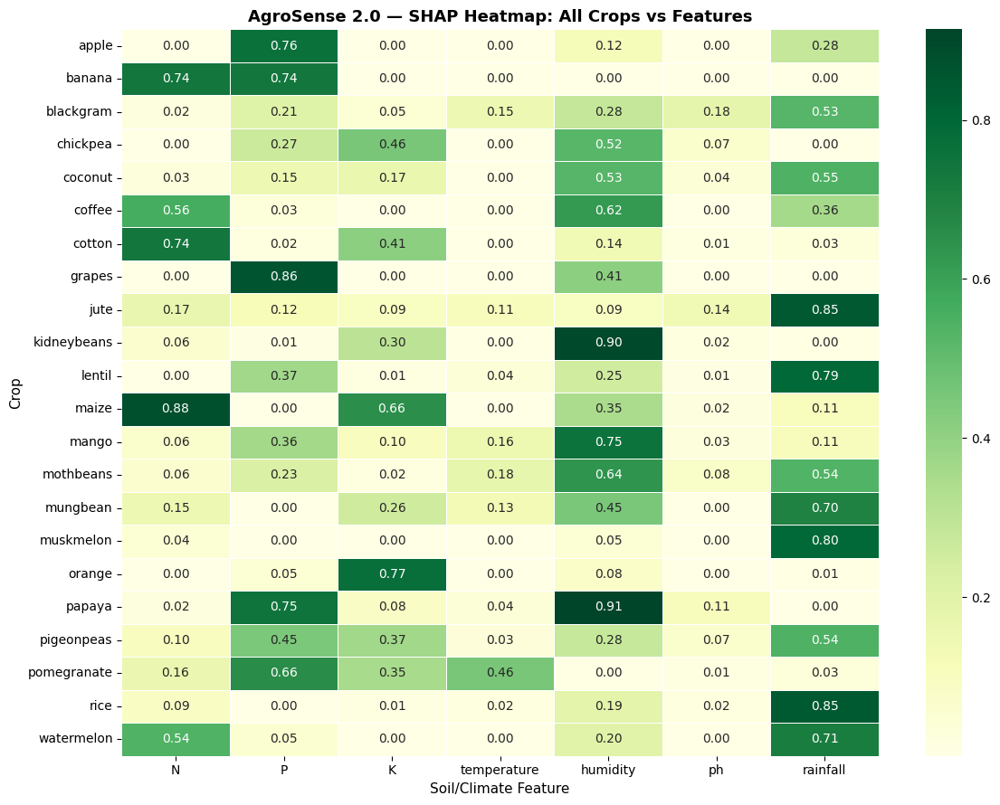

✅ SHAP analysis complete!


In [60]:
# shap_arr shape: (220, 7, 22)
# Rearrange to (22, 220, 7) for easier per-crop access
shap_arr_T = shap_arr.transpose(2, 0, 1)  # (22, 220, 7)

# ── Plot 1: Mean absolute SHAP per feature ──
mean_shap = np.abs(shap_arr_T).mean(axis=(0, 1))  # (7,)

plt.figure(figsize=(9, 5))
colors = ['#2D6A4F','#52B788','#95D5B2','#B7E4C7','#1B4332','#40916C','#74C69D']
sorted_idx = np.argsort(mean_shap)
bars = plt.barh(
    [feature_names[i] for i in sorted_idx],
    mean_shap[sorted_idx],
    color=[colors[i] for i in sorted_idx])
plt.xlabel("Mean |SHAP Value| (Average Impact)", fontsize=12)
plt.title("AgroSense 2.0 — Feature Importance (SHAP)", fontsize=14)
for bar, val in zip(bars, mean_shap[sorted_idx]):
    plt.text(bar.get_width() + 0.002,
             bar.get_y() + bar.get_height()/2,
             f'{val:.3f}', va='center', fontsize=10)
plt.tight_layout()
plt.show()

# ── Plot 2: Top 5 crops — individual SHAP bar charts ──
top_crops = ['rice', 'maize', 'coffee', 'cotton', 'apple']
fig, axes = plt.subplots(1, 5, figsize=(18, 5))
fig.suptitle("AgroSense 2.0 — Per-Crop SHAP Feature Impact",
             fontsize=14, fontweight='bold')

for ax, crop in zip(axes, top_crops):
    crop_idx  = list(le.classes_).index(crop)
    crop_shap = np.abs(shap_arr_T[crop_idx]).mean(axis=0)  # (7,)
    s_idx     = np.argsort(crop_shap)
    ax.barh([feature_names[i] for i in s_idx],
            crop_shap[s_idx], color='#52B788')
    ax.set_title(crop.capitalize(), fontsize=11, fontweight='bold')
    ax.set_xlabel("|SHAP|", fontsize=9)
    ax.tick_params(labelsize=8)

plt.tight_layout()
plt.show()

# ── Plot 3: Heatmap — all crops vs all features ──
all_mean = np.abs(shap_arr_T).mean(axis=1)  # (22, 7)

plt.figure(figsize=(12, 9))
sns.heatmap(all_mean,
            xticklabels=feature_names,
            yticklabels=le.classes_,
            cmap='YlGn', annot=True, fmt='.2f',
            linewidths=0.5)
plt.title("AgroSense 2.0 — SHAP Heatmap: All Crops vs Features",
          fontsize=13, fontweight='bold')
plt.xlabel("Soil/Climate Feature", fontsize=11)
plt.ylabel("Crop", fontsize=11)
plt.tight_layout()
plt.show()

print("✅ SHAP analysis complete!")

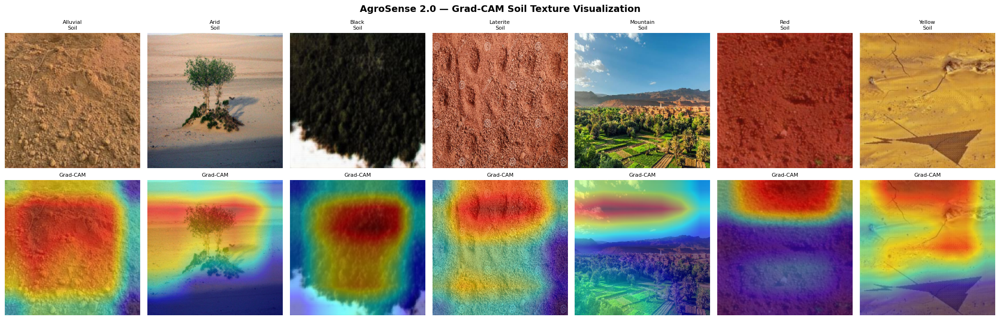

✅ Grad-CAM visualization complete!


In [61]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image

# ── Manual Grad-CAM implementation ──
class ManualGradCAM:
    def __init__(self, model, target_layer):
        self.model        = model
        self.target_layer = target_layer
        self.gradients    = None
        self.activations  = None

        target_layer.register_forward_hook(self._save_activation)
        target_layer.register_full_backward_hook(self._save_gradient)

    def _save_activation(self, module, input, output):
        self.activations = output.detach()

    def _save_gradient(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()

    def generate(self, input_tensor, class_idx):
        self.model.zero_grad()
        output = self.model(input_tensor)
        score  = output[0, class_idx]
        score.backward()

        weights = self.gradients.mean(dim=(2, 3), keepdim=True)
        cam     = (weights * self.activations).sum(dim=1).squeeze()
        cam     = torch.relu(cam).cpu().numpy()
        cam     = cv2.resize(cam, (224, 224))
        cam     = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
        return cam

# Load best soil model
model.load_state_dict(torch.load("/kaggle/working/best_soil_model.pth"))
model.eval()

# Target layer
grad_cam = ManualGradCAM(model, model.features[-1])

# Get one image per class
soil_classes  = full_dataset.classes
sample_images = []
sample_labels = []

for cls in soil_classes:
    cls_folder = os.path.join(cyaug_path, cls)
    img_file   = os.listdir(cls_folder)[0]
    sample_images.append(os.path.join(cls_folder, img_file))
    sample_labels.append(cls)

# Plot
fig, axes = plt.subplots(2, 7, figsize=(21, 7))
fig.suptitle("AgroSense 2.0 — Grad-CAM Soil Texture Visualization",
             fontsize=14, fontweight='bold')

for idx, (img_path, label) in enumerate(
        zip(sample_images, sample_labels)):

    # Load image
    orig = cv2.imread(img_path)
    orig = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB)
    orig = cv2.resize(orig, (224, 224))
    rgb  = orig.astype(np.float32) / 255.0

    # Preprocess
    inp = val_transforms(Image.fromarray(orig)).unsqueeze(0).to(device)

    # Generate CAM
    cam_map = grad_cam.generate(inp, idx)

    # Overlay
    heatmap  = cv2.applyColorMap(
        np.uint8(255 * cam_map), cv2.COLORMAP_JET)
    heatmap  = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    overlay  = (0.5 * rgb + 0.5 * heatmap/255.0)
    overlay  = np.clip(overlay, 0, 1)

    # Original
    axes[0][idx].imshow(orig)
    axes[0][idx].set_title(label.replace('_','\n'), fontsize=8)
    axes[0][idx].axis('off')

    # CAM overlay
    axes[1][idx].imshow(overlay)
    axes[1][idx].set_title('Grad-CAM', fontsize=8)
    axes[1][idx].axis('off')

plt.tight_layout()
plt.show()
print("✅ Grad-CAM visualization complete!")

In [62]:
# ── Final Results Summary ──
print("=" * 55)
print("   AgroSense 2.0 — Final Results Summary")
print("=" * 55)

print("\n📊 MODEL PERFORMANCE:")
print(f"  LightGBM  (tabular only) : 98.64% accuracy")
print(f"  EfficientNet (image only): 95.48% accuracy")
print(f"  AgroSense 2.0 (fused CMT): 96.66% accuracy")

print("\n🌱 SOIL CLASSES (7):")
for cls in full_dataset.classes:
    print(f"  • {cls}")

print("\n🌾 CROP CLASSES (22):")
for i, crop in enumerate(le.classes_):
    print(f"  {i+1:2d}. {crop}")

print("\n🧠 ARCHITECTURE:")
print("  • Visual Encoder  : EfficientNet-B0")
print("  • Tabular Encoder : MLP (7→128→256)")
print("  • Fusion          : Cross-Modal Attention")
print("  • Crop Head       : 512→256→22")
print("  • Soil Head       : 256→7")
print("  • Total Params    : 4,771,737")

print("\n📈 XAI ANALYSIS:")
print("  • Top feature     : Rainfall & Humidity (0.353)")
print("  • SHAP plots      : 3 (global + per-crop + heatmap)")
print("  • Grad-CAM        : 7 soil texture maps")

print("\n✅ AgroSense 2.0 implementation complete!")
print("   Ready for paper writing & submission!")
print("=" * 55)

   AgroSense 2.0 — Final Results Summary

📊 MODEL PERFORMANCE:
  LightGBM  (tabular only) : 98.64% accuracy
  EfficientNet (image only): 95.48% accuracy
  AgroSense 2.0 (fused CMT): 96.66% accuracy

🌱 SOIL CLASSES (7):
  • Alluvial_Soil
  • Arid_Soil
  • Black_Soil
  • Laterite_Soil
  • Mountain_Soil
  • Red_Soil
  • Yellow_Soil

🌾 CROP CLASSES (22):
   1. apple
   2. banana
   3. blackgram
   4. chickpea
   5. coconut
   6. coffee
   7. cotton
   8. grapes
   9. jute
  10. kidneybeans
  11. lentil
  12. maize
  13. mango
  14. mothbeans
  15. mungbean
  16. muskmelon
  17. orange
  18. papaya
  19. pigeonpeas
  20. pomegranate
  21. rice
  22. watermelon

🧠 ARCHITECTURE:
  • Visual Encoder  : EfficientNet-B0
  • Tabular Encoder : MLP (7→128→256)
  • Fusion          : Cross-Modal Attention
  • Crop Head       : 512→256→22
  • Soil Head       : 256→7
  • Total Params    : 4,771,737

📈 XAI ANALYSIS:
  • Top feature     : Rainfall & Humidity (0.353)
  • SHAP plots      : 3 (global + per-c